In [2]:
import os
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt
import face_recognition
import pickle

In [3]:
class AdaptivePreprocessor:
    """Adaptive preprocessing based on image quality analysis"""
    
    def __init__(self):
        pass
    
    def estimate_brightness(self, image):
        """Estimate image brightness (0-255)"""
        gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
        return np.mean(gray)
    
    def estimate_contrast(self, image):
        """Estimate image contrast"""
        gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
        return np.std(gray)
    
    def estimate_blur(self, image):
        """Estimate blur using Laplacian variance (lower = more blurry)"""
        gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
        return cv.Laplacian(gray, cv.CV_64F).var()
    
    def apply_clahe(self, image, clip_limit=2.0):
        """CLAHE for illumination normalization"""
        lab = cv.cvtColor(image, cv.COLOR_BGR2LAB)
        l, a, b = cv.split(lab)
        clahe = cv.createCLAHE(clipLimit=clip_limit, tileGridSize=(8, 8))
        cl = clahe.apply(l)
        return cv.cvtColor(cv.merge((cl, a, b)), cv.COLOR_LAB2BGR)
    
    def apply_gamma_correction(self, image, gamma):
        """
        Gamma correction for brightness adjustment
        gamma < 1.0 = brighten image
        gamma > 1.0 = darken image
        """
        inv_gamma = 1.0 / gamma
        table = np.array([((i / 255.0) ** inv_gamma) * 255
                          for i in np.arange(256)]).astype("uint8")
        return cv.LUT(image, table)
    
    def apply_unsharp_mask(self, image, sigma=1.0, strength=0.5):
        """Unsharp mask for mild sharpening"""
        blurred = cv.GaussianBlur(image, (0, 0), sigma)
        sharpened = cv.addWeighted(image, 1.0 + strength, blurred, -strength, 0)
        return sharpened
    
    def apply_bilateral_denoise(self, image):
        """Bilateral filter - preserves edges while denoising"""
        return cv.bilateralFilter(image, 9, 75, 75)
    
    def process(self, image):
        """Adaptive preprocessing pipeline"""
        processed = image.copy()
        
        brightness = self.estimate_brightness(processed)
        contrast = self.estimate_contrast(processed)
        blur_score = self.estimate_blur(processed)
        
        # 1. Fix low light (brightness < 80)
        if brightness < 80:
            gamma = 0.6  # Brighten
            gamma = 0.5 + (brightness / 160)  # Range: 0.5-1.0 based on darkness
            processed = self.apply_gamma_correction(processed, gamma)
        
        # Fix overexposure (brightness > 180)
        elif brightness > 180:
            gamma = 1.5  # Darken
            processed = self.apply_gamma_correction(processed, gamma)
        
        # 2. Fix low contrast (std < 40)
        if contrast < 40:
            processed = self.apply_clahe(processed, clip_limit=3.0)
        elif contrast < 60:
            processed = self.apply_clahe(processed, clip_limit=2.0)
        
        # 3. Fix blur (variance < 100 indicates blur)
        if blur_score < 100:
            processed = self.apply_unsharp_mask(processed, sigma=1.0, strength=0.8)
        elif blur_score < 300:
            processed = self.apply_unsharp_mask(processed, sigma=1.0, strength=0.3)
        
        # 4. Light denoise (always helpful)
        processed = self.apply_bilateral_denoise(processed)
        
        return processed
    

    def align_face(self, image, face_location):
        """
        Align face by rotating based on eye positions
        
        Args:
            image: Input image
            face_location: Single face location tuple (top, right, bottom, left)
        
        Returns:
            aligned_face: Rotated and aligned face
        """
        # Handle if list is passed instead of tuple
        if isinstance(face_location, list):
            if len(face_location) == 0:
                return image
            face_location = face_location[0]
        
        # Validate face_location is a tuple with 4 elements
        if not isinstance(face_location, tuple) or len(face_location) != 4:
            return image
        
        try:
            face_landmarks = face_recognition.face_landmarks(image, [face_location])
            
            if len(face_landmarks) > 0:
                landmarks = face_landmarks[0]
                
                # Check if eyes exist in landmarks
                if 'left_eye' not in landmarks or 'right_eye' not in landmarks:
                    return image
                
                left_eye = landmarks['left_eye']
                right_eye = landmarks['right_eye']
                
                left_eye_center = np.mean(left_eye, axis=0).astype(int)
                right_eye_center = np.mean(right_eye, axis=0).astype(int)
                
                dy = right_eye_center[1] - left_eye_center[1]
                dx = right_eye_center[0] - left_eye_center[0]
                angle = np.degrees(np.arctan2(dy, dx))
                
                top, right, bottom, left = face_location
                center = ((left + right) // 2, (top + bottom) // 2)
                
                rotation_matrix = cv.getRotationMatrix2D(center, angle, 1.0)
                aligned_image = cv.warpAffine(image, rotation_matrix, 
                                             (image.shape[1], image.shape[0]),
                                             flags=cv.INTER_CUBIC)
                
                return aligned_image
        except Exception as e:
            print(f"Alignment error: {e}")
        
        return image
    
    @staticmethod
    def get_largest_face(face_locations):
        """Get the largest face from list of face locations"""
        if not face_locations:
            return []
        return [max(face_locations, key=lambda f: (f[2] - f[0]) * (f[1] - f[3]))]

In [25]:
class FaceRecognitionHogDlib:
    def __init__(self, file_path, confidence, model='hog'):
        self.known_list_encoding = []
        self.known_list_ids = []
        self.file_path = file_path
        self.confidence = confidence
        self.detect_model = model
        self.load_encodings()
    
    def load_encodings(self):
        if os.path.exists(self.file_path):
            with open(self.file_path, 'rb') as f:
                data = pickle.load(f)
                self.known_list_encoding = data.get('encodings', [])
                self.known_list_ids = data.get('ids', [])
        else:
            self.known_list_encoding = []
            self.known_list_ids = []


    def save_encoding(self):
        data = {
            'encodings': self.known_list_encoding,
            'ids': self.known_list_ids
        }
        with open(self.file_path, 'wb') as f:
            pickle.dump(data, f)

    def compare_encoding(self, encoding):
        if len(self.known_list_encoding) == 0:
            return None, None, False
        
        matches = face_recognition.compare_faces(self.known_list_encoding, encoding, tolerance=self.confidence)
        distances = face_recognition.face_distance(self.known_list_encoding, encoding)
        
        if True in matches:
            best_match_index = int(np.argmin(distances))
            best_distance = float(distances[best_match_index])  # Convert to Python float
            return self.known_list_ids[best_match_index], best_distance, True
        else:
            best_distance = float(np.min(distances)) if len(distances) > 0 else None
            return None, best_distance, False
        
    def recognise_face(self, face_img, face_location):
        if isinstance(face_location, list):
            known_locations = face_location
        else:
            known_locations = [face_location]
        
        face_encoding = face_recognition.face_encodings(face_img, model='small', known_face_locations=known_locations)

        if len(face_encoding) > 0:
            successful = True
            print(" Success")
            return face_encoding[0], successful
        else:
            print(" Failed")
            successful = False
            return None, successful
    
    def detect_face(self, face_img):
        face_loc = face_recognition.face_locations(face_img, model=self.detect_model)
        if not face_loc:
            print(" No face detected")
            return None
        else:
            return face_loc


    def register_face(self, encoding, id):
        self.known_list_encoding.append(encoding)
        self.known_list_ids.append(id)
        self.save_encoding()
        

In [5]:
def load_img_from_folder(folder_path):
    valid_extensions = ('.jpg', '.jpeg', '.png', '.webp')
    image_list = []
    filename_list = []

    for filename in os.listdir(folder_path):
        ext = os.path.splitext(filename)[1].lower()
        if ext in valid_extensions:
            img_path = os.path.join(folder_path, filename)
            img = cv.imread(img_path)
            if img is not None:
                image_list.append(img)
                filename_list.append(os.path.splitext(filename)[0])
            else:
                print(f"Warning: Unable to read image {img_path}")
    return image_list, filename_list

In [6]:
img_folder_path = "Image"
images, studentID_list = load_img_from_folder(img_folder_path)
print(f"Loaded {len(images)} faces")

Loaded 33 faces


In [40]:
def verify_pipeline_hog_dlib(hog_dlib_model: FaceRecognitionHogDlib, preprocessor: AdaptivePreprocessor, model='hog'):
    """Factory function that returns a verify function"""
    def verify_face(face_img):
        processed_face = preprocessor.process(face_img)
        rgb_face = cv.cvtColor(processed_face, cv.COLOR_BGR2RGB)
        face_loc = hog_dlib_model.detect_face(rgb_face)
        max_face_loc = AdaptivePreprocessor.get_largest_face(face_loc)
        
        if not max_face_loc:
            return "No Face Detected", False
        
        aligned_face = preprocessor.align_face(rgb_face, max_face_loc)
        face_encoding, success = hog_dlib_model.recognise_face(aligned_face, max_face_loc)
        
        if not success:
            return "No Face Detected", False
        
        id, distance, matched = hog_dlib_model.compare_encoding(face_encoding)
        
        if matched:
            # Return tuple format: ((id, distance, matched), success)
            return (id, distance, True), True
        else:
            # Return tuple format: ((None, distance, False), False)
            return (None, distance, False), False
    
    return verify_face

def register_pipeline_hog_dlib(hog_dlib_model:FaceRecognitionHogDlib, preprocessor: AdaptivePreprocessor, face_img, id, model='hog'):
    processed_face = preprocessor.process(face_img)
    rgb_face = cv.cvtColor(processed_face, cv.COLOR_BGR2RGB)
    face_loc = hog_dlib_model.detect_face(rgb_face)
    max_face_loc = AdaptivePreprocessor.get_largest_face(face_loc)
    if not max_face_loc:
        print(" No face detected")
        return None,False
    else:
        aligned_face = preprocessor.align_face(rgb_face, max_face_loc)
        face_encoding, success = hog_dlib_model.recognise_face(aligned_face, max_face_loc)
        if not success:
            print(" Face recognition failed")
            return None,False
        else:
            hog_dlib_model.register_face(face_encoding, id)
            print(f" Registered ID: {id}")
            return id,True

In [27]:
countSuccess = 0
preprocessor = AdaptivePreprocessor()
hog_dlib = FaceRecognitionHogDlib(file_path="encodings\\hb_encoding.pkl", confidence=0.6)

for idx, (face_img, id) in enumerate(zip(images, studentID_list)):
    print(f"Processing [{idx+1}/{len(images)}] {id}...", end=" ")
    _, status = register_pipeline_hog_dlib(hog_dlib, preprocessor, face_img, id, model='hog')
    if status:
        countSuccess += 1

print(f"Registered {countSuccess}/{len(images)} faces successfully.")

Processing [1/33] 23WMA06667...  Success
 Registered ID: 23WMA06667
Processing [2/33] 23WMA09991...  Success
 Registered ID: 23WMA09991
Processing [3/33] 23WMA09992...  Success
 Registered ID: 23WMA09992
Processing [4/33] 23WMA09993...  Success
 Registered ID: 23WMA09993
Processing [5/33] 23WMA09994...  Success
 Registered ID: 23WMA09994
Processing [6/33] 23WMA09998...  Success
 Registered ID: 23WMA09998
Processing [7/33] 23WMA31290...  Success
 Registered ID: 23WMA31290
Processing [8/33] 24WMR00272...  Success
 Registered ID: 24WMR00272
Processing [9/33] 24WMR06014...  Success
 Registered ID: 24WMR06014
Processing [10/33] 24WMR06069...  Success
 Registered ID: 24WMR06069
Processing [11/33] 24WMR07001...  Success
 Registered ID: 24WMR07001
Processing [12/33] 24WMR07039...  Success
 Registered ID: 24WMR07039
Processing [13/33] 24WMR07055...  Success
 Registered ID: 24WMR07055
Processing [14/33] 24WMR07058...  Success
 Registered ID: 24WMR07058
Processing [15/33] 24WMR07088...  Success
 

In [28]:
## Create Test Scenarios (Blur, Noise, Brightness, etc.)

def create_test_scenarios(image):
    """
    Create different test scenarios from one image
    
    Returns: dict with scenario name and augmented image
    """
    scenarios = {}
    
    # 1. Original
    scenarios['original'] = image.copy()
    
    # 2. Gaussian Blur (simulates out-of-focus camera)
    scenarios['blur_light'] = cv.GaussianBlur(image, (5, 5), 0)
    scenarios['blur_medium'] = cv.GaussianBlur(image, (9, 9), 0)
    scenarios['blur_heavy'] = cv.GaussianBlur(image, (15, 15), 0)
    
    # 3. Motion Blur
    kernel_size = 15
    kernel_motion = np.zeros((kernel_size, kernel_size))
    kernel_motion[int((kernel_size-1)/2), :] = np.ones(kernel_size)
    kernel_motion = kernel_motion / kernel_size
    scenarios['motion_blur'] = cv.filter2D(image, -1, kernel_motion)
    
    # 4. Gaussian Noise
    noise = np.random.normal(0, 25, image.shape).astype(np.uint8)
    scenarios['noise'] = cv.add(image, noise)
    
    # 5. Low Light (Dark)
    scenarios['low_light'] = cv.convertScaleAbs(image, alpha=0.5, beta=-30)
    
    # 6. High Light (Bright)
    scenarios['high_light'] = cv.convertScaleAbs(image, alpha=1.2, beta=30)
    
    # 7. Low Contrast
    scenarios['low_contrast'] = cv.convertScaleAbs(image, alpha=0.7, beta=0)
    
    # 8. High Contrast
    scenarios['high_contrast'] = cv.convertScaleAbs(image, alpha=1.5, beta=0)
    
    # 9. JPEG Compression artifacts
    encode_param = [int(cv.IMWRITE_JPEG_QUALITY), 20]  # Low quality
    _, encoded = cv.imencode('.jpg', image, encode_param)
    scenarios['jpeg_compressed'] = cv.imdecode(encoded, 1)
    
    # 10. Rotation (slight angle)
    h, w = image.shape[:2]
    M = cv.getRotationMatrix2D((w/2, h/2), 10, 1.0)
    scenarios['rotated_10'] = cv.warpAffine(image, M, (w, h))
    
    # 11. Zoomed (scale)
    M = cv.getRotationMatrix2D((w/2, h/2), 0, 1.2)
    scenarios['zoomed'] = cv.warpAffine(image, M, (w, h))
    
    # 12. Cropped Face (tight crop)
    rgb_img = cv.cvtColor(image, cv.COLOR_BGR2RGB)
    face_locations = face_recognition.face_locations(rgb_img, model="hog")
    if len(face_locations) > 0:
        top, right, bottom, left = face_locations[0]
        # Tight crop
        scenarios['cropped_tight'] = image[top:bottom, left:right].copy()
        
        # Crop with 50% padding
        face_h, face_w = bottom - top, right - left
        pad_h, pad_w = int(face_h * 0.1), int(face_w * 0.1)
        h, w = image.shape[:2]
        new_top = max(0, top + pad_h)
        new_bottom = min(h, bottom - pad_h)
        new_left = max(0, left + pad_w)
        new_right = min(w, right - pad_w)
        scenarios['cropped_padded'] = image[new_top:new_bottom, new_left:new_right].copy()
    
    return scenarios

In [29]:
test_img_list, type_test = load_img_from_folder("test_set/fz")
## Append All Scenarios to Test Lists
# Store original counts
original_count = len(test_img_list)

# Create new lists to store all scenarios
augmented_test_img_list = []
augmented_type_test = []

# For each test image, create scenarios and append
for img, img_name in zip(test_img_list, type_test):
    print(f"\nProcessing: {img_name}")
    
    # Create scenarios
    scenarios = create_test_scenarios(img)
    
    # Append each scenario to lists
    for scenario_name, scenario_img in scenarios.items():
        augmented_test_img_list.append(scenario_img)
        augmented_type_test.append(f"{img_name}_{scenario_name}")
    
    print(f"  → Created {len(scenarios)} scenarios")

print("\n" + "=" * 60)
print(f"✓ Original test images: {original_count}")
print(f"✓ Total test images (with scenarios): {len(augmented_test_img_list)}")
print(f"✓ Scenarios per image: {len(augmented_test_img_list) // original_count}")
print("=" * 60)

# Show sample names
print("\nSample augmented names:")
for i in range(min(15, len(augmented_type_test))):
    print(f"  {i+1}. {augmented_type_test[i]}")


Processing: 1_normal
  → Created 15 scenarios

Processing: 2_no_spec
  → Created 15 scenarios

✓ Original test images: 2
✓ Total test images (with scenarios): 30
✓ Scenarios per image: 15

Sample augmented names:
  1. 1_normal_original
  2. 1_normal_blur_light
  3. 1_normal_blur_medium
  4. 1_normal_blur_heavy
  5. 1_normal_motion_blur
  6. 1_normal_noise
  7. 1_normal_low_light
  8. 1_normal_high_light
  9. 1_normal_low_contrast
  10. 1_normal_high_contrast
  11. 1_normal_jpeg_compressed
  12. 1_normal_rotated_10
  13. 1_normal_zoomed
  14. 1_normal_cropped_tight
  15. 1_normal_cropped_padded


In [36]:
# Cell: Add these helper functions BEFORE the test_recognition_pipeline function

def calculate_summary(all_results, folder, true_id):
    """Calculate summary statistics from results"""
    total = len(all_results)
    correct_count = sum(1 for r in all_results if r['correct'])
    no_face_count = sum(1 for r in all_results if r['pred_id'] == "No Face")
    not_matched_count = sum(1 for r in all_results if r['pred_id'] == "Not Matched")
    wrong_count = total - correct_count - no_face_count - not_matched_count
    
    return {
        'folder': folder,
        'true_id': true_id,
        'total': total,
        'correct': correct_count,
        'wrong': wrong_count,
        'not_matched': not_matched_count,
        'no_face': no_face_count,
        'accuracy': correct_count / total * 100 if total > 0 else 0,
        'accuracy_excl_noface': correct_count / (total - no_face_count) * 100 if (total - no_face_count) > 0 else 0
    }


def print_summary(summary, all_results):
    """Print summary and scenario breakdown"""
    total = summary['total']
    
    print(f"\n{'=' * 70}")
    print(f"📊 Summary for {summary['folder']} (ID: {summary['true_id']})")
    print(f"{'=' * 70}")
    print(f"✓ Correct:          {summary['correct']}/{total} ({summary['accuracy']:.2f}%)")
    print(f"✗ Wrong Match:      {summary['wrong']}/{total} ({summary['wrong']/total*100:.2f}%)")
    print(f"⚠ Not Matched:      {summary['not_matched']}/{total} ({summary['not_matched']/total*100:.2f}%)")
    print(f"👤 No Face Detected: {summary['no_face']}/{total} ({summary['no_face']/total*100:.2f}%)")
    
    if (total - summary['no_face']) > 0:
        print(f"\n📈 Accuracy (excluding no-face): {summary['accuracy_excl_noface']:.2f}%")
    
    # Scenario breakdown
    print(f"\n📋 Accuracy by Scenario:")
    print("-" * 70)
    scenario_summary = {}
    for r in all_results:
        parts = r['test_name'].split('_')
        scenario = '_'.join(parts[1:]) if len(parts) > 1 else r['test_name']
        
        if scenario not in scenario_summary:
            scenario_summary[scenario] = {'total': 0, 'correct': 0, 'no_face': 0}
        scenario_summary[scenario]['total'] += 1
        if r['correct']:
            scenario_summary[scenario]['correct'] += 1
        if r['pred_id'] == 'No Face':
            scenario_summary[scenario]['no_face'] += 1
    
    for scenario, data in scenario_summary.items():
        acc = data['correct'] / data['total'] * 100
        print(f"{scenario:20s}: {data['correct']}/{data['total']} ({acc:.1f}%) | No Face: {data['no_face']}")

In [33]:
def test_recognition_pipeline(test_folder, true_student_id, verify_fn, recognizer_name, create_scenarios=True):
    """
    Universal test function that accepts a custom verify function
    
    Args:
        test_folder: Path to test images folder
        true_student_id: Expected student ID for this folder
        verify_fn: Function that takes (image) and returns:
                   - ("No Face Detected", False) for no face
                   - ((matched_id, distance, is_matched), success) for results
        recognizer_name: Display name for the recognizer
        create_scenarios: Whether to create augmented test scenarios
    
    Returns:
        all_results: List of result dictionaries
        summary: Summary statistics dictionary
    """
    # Load test images
    test_img_list, type_test = load_img_from_folder(test_folder)
    
    if len(test_img_list) == 0:
        print(f"⚠ No images found in {test_folder}")
        return [], {}
    
    # Create scenarios if enabled
    if create_scenarios:
        augmented_test_img_list = []
        augmented_type_test = []
        
        for img, img_name in zip(test_img_list, type_test):
            scenarios = create_test_scenarios(img)
            for scenario_name, scenario_img in scenarios.items():
                augmented_test_img_list.append(scenario_img)
                augmented_type_test.append(f"{img_name}_{scenario_name}")
    else:
        augmented_test_img_list = test_img_list
        augmented_type_test = type_test
    
    print(f"\n{'=' * 70}")
    print(f"🧪 Testing: {test_folder}")
    print(f"   Recognizer: {recognizer_name}")
    print(f"   Expected ID: {true_student_id}")
    print(f"   Total test images: {len(augmented_test_img_list)}")
    print(f"{'=' * 70}")
    
    all_results = []
    
    for idx, (test_img, img_name) in enumerate(zip(augmented_test_img_list, augmented_type_test)):
        print(f"Testing [{idx+1}/{len(augmented_test_img_list)}] {img_name}...", end="")
        
        # Run the passed verify function
        result, success = verify_fn(test_img)
        
        # Process result
        if result == "No Face Detected":
            pred_id = "No Face"
            distance = None
            confidence = 0.0
            correct = False
        elif success and result is not None:
            matched_id, dist, _ = result
            pred_id = matched_id if matched_id else "Unknown"
            
            if dist is not None:
                if isinstance(dist, np.ndarray):
                    distance = float(dist.flat[0])
                elif hasattr(dist, 'item'):
                    distance = float(dist.item())
                else:
                    distance = float(dist)
                confidence = max(0, min(1, 1 - distance))
            else:
                distance = None
                confidence = 0.0
                
            correct = (pred_id == true_student_id)
        else:
            pred_id = "Not Matched"
            distance = None
            confidence = 0.0
            correct = False
        
        result_dict = {
            'test_name': img_name,
            'true_id': true_student_id,
            'pred_id': pred_id,
            'distance': distance,
            'confidence': confidence,
            'correct': correct,
            'folder': test_folder
        }
        all_results.append(result_dict)
        
        status = "✓" if correct else "✗"
        dist_str = f"{distance:.4f}" if distance is not None else "N/A"
        print(f" {status} → {pred_id:15s} (Conf: {confidence:.2%}, Dist: {dist_str})")
    
    # Calculate summary
    summary = calculate_summary(all_results, test_folder, true_student_id)
    print_summary(summary, all_results)
    
    return all_results, summary


def test_all_folders_unified(test_config, verify_fn, recognizer_name="Custom", create_scenarios=True):
    """
    Universal function to test multiple folders with any verify function
    
    Args:
        test_config: Dict mapping folder paths to student IDs
        verify_fn: Function that takes (image) and returns result
        recognizer_name: Display name for the recognizer
        create_scenarios: Whether to create augmented test scenarios
    
    Returns:
        all_results: Combined results from all folders
        all_summaries: List of summary dicts for each folder
    """
    all_results = []
    all_summaries = []
    
    for folder, student_id in test_config.items():
        results, summary = test_recognition_pipeline(
            folder, student_id, verify_fn, recognizer_name, create_scenarios
        )
        all_results.extend(results)
        all_summaries.append(summary)
    
    # Print overall summary
    print("\n" + "=" * 95)
    print(f"📊 OVERALL SUMMARY - {recognizer_name}")
    print("=" * 95)
    
    total_all = sum(s['total'] for s in all_summaries)
    correct_all = sum(s['correct'] for s in all_summaries)
    wrong_all = sum(s['wrong'] for s in all_summaries)
    not_matched_all = sum(s['not_matched'] for s in all_summaries)
    no_face_all = sum(s['no_face'] for s in all_summaries)
    
    print(f"\n{'Folder':<20} {'ID':<15} {'Correct':<12} {'Wrong':<10} {'No Match':<10} {'No Face':<10} {'Accuracy':<10}")
    print("-" * 95)
    
    for s in all_summaries:
        folder_name = s['folder'].split('/')[-1]
        print(f"{folder_name:<20} {s['true_id']:<15} {s['correct']}/{s['total']:<8} {s['wrong']:<10} {s['not_matched']:<10} {s['no_face']:<10} {s['accuracy']:.1f}%")
    
    print("-" * 95)
    overall_acc = correct_all / total_all * 100 if total_all > 0 else 0
    print(f"{'TOTAL':<20} {'':<15} {correct_all}/{total_all:<8} {wrong_all:<10} {not_matched_all:<10} {no_face_all:<10} {overall_acc:.1f}%")
    
    if (total_all - no_face_all) > 0:
        acc_excl = correct_all / (total_all - no_face_all) * 100
        print(f"\n📈 Overall Accuracy (excluding no-face): {acc_excl:.2f}%")
    
    print("=" * 95)
    
    return all_results, all_summaries

In [41]:
# Cell: Test All Recognizers with Unified Function

# Test configuration
test_config = {
    "test_set/fz": "24WMR08003",
    "test_set/ch": "24WMR08010", 
    "test_set/hy": "24WMR08035",
    "test_set/zq": "24WMR00272"
}

# Create verify functions
verify_hog_dlib = verify_pipeline_hog_dlib(hog_dlib, preprocessor)

# Test HOG/Dlib
print("\n" + "🔵" * 40)
print("TESTING: HOG + Dlib")
print("🔵" * 40)
hog_results, hog_summaries = test_all_folders_unified(
    test_config,
    verify_fn=verify_hog_dlib,
    recognizer_name="HOG+Dlib",
    create_scenarios=True
)


🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵
TESTING: HOG + Dlib
🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵🔵

🧪 Testing: test_set/fz
   Recognizer: HOG+Dlib
   Expected ID: 24WMR08003
   Total test images: 30
Testing [1/30] 1_normal_original... Success
 ✓ → 24WMR08003      (Conf: 57.91%, Dist: 0.4209)
Testing [2/30] 1_normal_blur_light... Success
 ✓ → 24WMR08003      (Conf: 57.69%, Dist: 0.4231)
Testing [3/30] 1_normal_blur_medium... Success
 ✓ → 24WMR08003      (Conf: 57.86%, Dist: 0.4214)
Testing [4/30] 1_normal_blur_heavy... Success
 ✓ → 24WMR08003      (Conf: 57.96%, Dist: 0.4204)
Testing [5/30] 1_normal_motion_blur... Success
 ✓ → 24WMR08003      (Conf: 61.81%, Dist: 0.3819)
Testing [6/30] 1_normal_noise... No face detected
 ✗ → No Face         (Conf: 0.00%, Dist: N/A)
Testing [7/30] 1_normal_low_light... Success
 ✓ → 24WMR08003      (Conf: 59.48%, Dist: 0.4052)
Testing [8/30] 1_normal_high_light... Success
 ✓ → 24WMR08003      (Conf: 54.30%, Dist: 0.4570)
Testing [9/30] 1_normal_low_co

In [42]:
import os
import cv2 as cv
import numpy as np
import pickle
from retinaface import RetinaFace
from deepface import DeepFace

In [ ]:

class FaceRecognitionDeepFace:
    """DeepFace Face Recognition - follows HOG+Dlib format with split detect/recognise"""
    
    def __init__(self, file_path, threshold=0.4, 
                 model_name='Facenet512', 
                 detector_backend='retinaface'):
        self.file_path = file_path
        self.threshold = threshold
        self.model_name = model_name
        self.detector_backend = detector_backend
        self.known_encodings = []
        self.known_ids = []
        
        print(f"Loading {model_name} model...")
        try:
            dummy_img = np.zeros((160, 160, 3), dtype=np.uint8)
            DeepFace.represent(
                dummy_img, 
                model_name=model_name, 
                detector_backend=detector_backend,
                enforce_detection=False
            )
            print(f"✓ DeepFace initialized: {model_name} + {detector_backend}")
        except Exception as e:
            print(f"Model warm-up: {e}")
        
        self.load_encodings()
    
    def load_encodings(self):
        if os.path.exists(self.file_path):
            with open(self.file_path, 'rb') as f:
                data = pickle.load(f)
                self.known_encodings = data.get('encodings', [])
                self.known_ids = data.get('ids', [])
                print(f"✓ Loaded {len(self.known_ids)} encodings")
        else:
            self.known_encodings = []
            self.known_ids = []
    
    def save_encoding(self):
        os.makedirs(os.path.dirname(self.file_path), exist_ok=True)
        with open(self.file_path, 'wb') as f:
            pickle.dump({
                'encodings': self.known_encodings,
                'ids': self.known_ids
            }, f)
    
    def compute_distance(self, enc1, enc2):
        """Compute cosine distance"""
        enc1, enc2 = np.array(enc1), np.array(enc2)
        dot = np.dot(enc1, enc2)
        norm1, norm2 = np.linalg.norm(enc1), np.linalg.norm(enc2)
        if norm1 == 0 or norm2 == 0:
            return 1.0
        return 1 - (dot / (norm1 * norm2))
    
    def detect_face(self, face_img):
        """
        Detect face in image - similar to HOG+Dlib detect_face
        
        Returns:
            face_region: Dict with facial_area info, or None if no face
        """
        try:
            # Use DeepFace.extract_faces for detection only
            faces = DeepFace.extract_faces(
                face_img,
                detector_backend=self.detector_backend,
                enforce_detection=True,
                align=False  # Don't align yet, just detect
            )
            
            if len(faces) == 0:
                print(" No face detected")
                return None
            
            # Return largest face (by area)
            largest_face = max(faces, key=lambda f: f['facial_area']['w'] * f['facial_area']['h'])
            return largest_face
            
        except ValueError as e:
            if "Face could not be detected" in str(e):
                print(" No face detected")
                return None
            print(f" Detection error: {e}")
            return None
        except Exception as e:
            print(f" Detection error: {e}")
            return None
    
    def recognise_face(self, face_img, face_region=None):
        """
        
        Args:
            face_img: Input image (RGB)
            face_region: Optional face region from detect_face (not used for DeepFace, 
                        but kept for API consistency)
        
        Returns:
            encoding: Face embedding array
            success: Boolean indicating success
        """
        try:
            # DeepFace.represent does detection + embedding extraction
            result = DeepFace.represent(
                face_img,
                model_name=self.model_name,
                detector_backend=self.detector_backend,
                enforce_detection=True,
                align=True
            )
            
            if len(result) == 0:
                print(" Failed")
                return None, False
            
            embedding = np.array(result[0]['embedding'])
            print(" Success")
            return embedding, True
            
        except ValueError as e:
            if "Face could not be detected" in str(e):
                print(" Failed")
                return None, False
            print(f" Failed: {e}")
            return None, False
        except Exception as e:
            print(f" Failed: {e}")
            return None, False
    
    def compare_encoding(self, encoding):
        """
        Compare encoding against known faces - same as HOG+Dlib
        
        Returns:
            matched_id: ID of best match or None
            distance: Distance to best match
            matched: Boolean indicating if match found
        """
        if len(self.known_encodings) == 0:
            return None, None, False
        
        best_dist = float('inf')
        best_id = None
        
        for known_enc, known_id in zip(self.known_encodings, self.known_ids):
            dist = self.compute_distance(encoding, known_enc)
            if dist < best_dist:
                best_dist = dist
                best_id = known_id
        
        if best_dist < self.threshold:
            return best_id, float(best_dist), True
        else:
            return None, float(best_dist), False
    
    def register_face(self, encoding, person_id):
        """Register encoding - same as HOG+Dlib"""
        self.known_encodings.append(encoding)
        self.known_ids.append(person_id)
        self.save_encoding()
    
    def clear_encodings(self):
        self.known_encodings = []
        self.known_ids = []
        if os.path.exists(self.file_path):
            os.remove(self.file_path)
        print("✓ Encodings cleared")

In [ ]:
# Cell: DeepFace Pipeline Functions (same pattern as HOG+Dlib)

def verify_pipeline_deepface(deepface_model: FaceRecognitionDeepFace, preprocessor: AdaptivePreprocessor):
    """Factory function that returns a verify function - same pattern as HOG+Dlib"""
    def verify_face(face_img):
        # 1. Preprocess
        processed_face = preprocessor.process(face_img)
        rgb_face = cv.cvtColor(processed_face, cv.COLOR_BGR2RGB)
        
        # 2. Detect face
        face_region = deepface_model.detect_face(rgb_face)
        
        if face_region is None:
            return "No Face Detected", False
        
        # 3. Get encoding (pass face_region for consistency
        face_encoding, success = deepface_model.recognise_face(rgb_face, face_region)
        
        if not success:
            return "No Face Detected", False
        
        # 4. Compare encoding
        id, distance, matched = deepface_model.compare_encoding(face_encoding)
        
        if matched:
            return (id, distance, True), True
        else:
            return (None, distance, False), False
    
    return verify_face


def register_pipeline_deepface(deepface_model: FaceRecognitionDeepFace, preprocessor: AdaptivePreprocessor, face_img, person_id):
    """Register face - same pattern as HOG+Dlib"""
    # 1. Preprocess
    processed_face = preprocessor.process(face_img)
    rgb_face = cv.cvtColor(processed_face, cv.COLOR_BGR2RGB)
    
    # 2. Detect face
    face_region = deepface_model.detect_face(rgb_face)
    
    if face_region is None:
        print(" No face detected")
        return None, False
    
    # 3. Get encoding
    face_encoding, success = deepface_model.recognise_face(rgb_face, face_region)
    
    if not success:
        print(" Face recognition failed")
        return None, False
    
    # 4. Register
    deepface_model.register_face(face_encoding, person_id)
    print(f" Registered ID: {person_id}")
    return person_id, True

In [ ]:
# Cell: Initialize and Register DeepFace

# Initialize
preprocessor = AdaptivePreprocessor()
deepface_model = FaceRecognitionDeepFace(
    file_path="encodings/deepface_facenet512.pkl",
    threshold=0.68,
    model_name='Facenet512',
    detector_backend='centerface'
)

# Clear and register
deepface_model.clear_encodings()
images, studentID_list = load_img_from_folder("Image")

count_success = 0
for idx, (face_img, student_id) in enumerate(zip(images, studentID_list)):
    print(f"Registering [{idx+1}/{len(images)}] {student_id}...", end="")
    _, status = register_pipeline_deepface(deepface_model, preprocessor, face_img, student_id)
    if status:
        count_success += 1

print(f"\n✓ Registered {count_success}/{len(images)} faces")

Loading Facenet512 model...
✓ DeepFace initialized: Facenet512 + retinaface
✓ Encodings cleared
Registering [1/33] 23WMA06667... Success
 Registered ID: 23WMA06667
Registering [2/33] 23WMA09991... Success
 Registered ID: 23WMA09991
Registering [3/33] 23WMA09992... Success
 Registered ID: 23WMA09992
Registering [4/33] 23WMA09993... Success
 Registered ID: 23WMA09993
Registering [5/33] 23WMA09994... Success
 Registered ID: 23WMA09994
Registering [6/33] 23WMA09998... Success
 Registered ID: 23WMA09998
Registering [7/33] 23WMA31290... Success
 Registered ID: 23WMA31290
Registering [8/33] 24WMR00272... Success
 Registered ID: 24WMR00272
Registering [9/33] 24WMR06014... Success
 Registered ID: 24WMR06014
Registering [10/33] 24WMR06069... Success
 Registered ID: 24WMR06069
Registering [11/33] 24WMR07001... Success
 Registered ID: 24WMR07001
Registering [12/33] 24WMR07039... Success
 Registered ID: 24WMR07039
Registering [13/33] 24WMR07055... Success
 Registered ID: 24WMR07055
Registering [14/

In [47]:
verify_deepface = verify_pipeline_deepface(deepface_model, preprocessor)

# Test
print("\n" + "🟢" * 40)
print("TESTING: DeepFace (Facenet512 + RetinaFace)")
print("🟢" * 40)
deepface_results, deepface_summaries = test_all_folders_unified(
    test_config,
    verify_fn=verify_deepface,
    recognizer_name="DeepFace+Facenet512",
    create_scenarios=True
)


🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢
TESTING: DeepFace (Facenet512 + RetinaFace)
🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢🟢

🧪 Testing: test_set/fz
   Recognizer: DeepFace+Facenet512
   Expected ID: 24WMR08003
   Total test images: 30
Testing [1/30] 1_normal_original... Success
 ✗ → 24WMR07088      (Conf: 64.34%, Dist: 0.3566)
Testing [2/30] 1_normal_blur_light... Success
 ✗ → 24WMR07088      (Conf: 63.61%, Dist: 0.3639)
Testing [3/30] 1_normal_blur_medium... Success
 ✗ → 24WMR07088      (Conf: 62.55%, Dist: 0.3745)
Testing [4/30] 1_normal_blur_heavy... Success
 ✓ → 24WMR08003      (Conf: 63.55%, Dist: 0.3645)
Testing [5/30] 1_normal_motion_blur... Success
 ✗ → 24WMR07088      (Conf: 64.50%, Dist: 0.3550)
Testing [6/30] 1_normal_noise... No face detected
 ✗ → No Face         (Conf: 0.00%, Dist: N/A)
Testing [7/30] 1_normal_low_light... Success
 ✗ → 24WMR07088      (Conf: 62.47%, Dist: 0.3753)
Testing [8/30] 1_normal_high_light... Success
 ✗ → 24WMR07088      (Conf: 64.33%, Dist: 0.3

In [ ]:
import os
import cv2 as cv
import numpy as np
import pickle
from mtcnn import MTCNN
from keras_facenet import FaceNet
from sklearn.preprocessing import Normalizer

class FaceRecognitionMTCNNFaceNet:
    
    def __init__(self, file_path, threshold=0.5, target_size=(160, 160)):
        self.file_path = file_path
        self.threshold = threshold  # Cosine similarity threshold
        self.target_size = target_size
        self.known_encodings = []
        self.known_ids = []
        
        # Initialize MTCNN detector and FaceNet embedder
        print("Loading MTCNN + FaceNet model...")
        try:
            self.detector = MTCNN()
            self.embedder = FaceNet()
            self.normalizer = Normalizer('l2')
            print(f"✓ MTCNN + FaceNet initialized")
        except Exception as e:
            print(f"Model initialization error: {e}")
        
        self.load_encodings()
    
    def load_encodings(self):
        if os.path.exists(self.file_path):
            with open(self.file_path, 'rb') as f:
                data = pickle.load(f)
                self.known_encodings = data.get('encodings', [])
                self.known_ids = data.get('ids', [])
                print(f"✓ Loaded {len(self.known_ids)} encodings")
        else:
            self.known_encodings = []
            self.known_ids = []
    
    def save_encoding(self):
        os.makedirs(os.path.dirname(self.file_path), exist_ok=True)
        with open(self.file_path, 'wb') as f:
            pickle.dump({
                'encodings': self.known_encodings,
                'ids': self.known_ids
            }, f)
    
    def compute_distance(self, enc1, enc2):
        """Compute cosine distance (lower = more similar)"""
        enc1, enc2 = np.array(enc1), np.array(enc2)
        dot = np.dot(enc1, enc2)
        norm1, norm2 = np.linalg.norm(enc1), np.linalg.norm(enc2)
        if norm1 == 0 or norm2 == 0:
            return 1.0
        similarity = dot / (norm1 * norm2)
        return 1 - similarity  # Convert to distance
    
    def detect_face(self, face_img):
        """
        Detect face in image - similar to HOG+Dlib detect_face
        
        Args:
            face_img: Input image (RGB)
        
        Returns:
            face_region: Dict with box and keypoints, or None if no face
        """
        try:
            faces = self.detector.detect_faces(face_img)
            
            if len(faces) == 0:
                print(" No face detected")
                return None
            
            # Return largest face (by area)
            largest_face = max(faces, key=lambda f: f['box'][2] * f['box'][3])
            return largest_face
            
        except Exception as e:
            print(f" Detection error: {e}")
            return None
    
    def recognise_face(self, face_img, face_region=None):
        """
        
        Args:
            face_img: Input image (RGB)
            face_region: Face region dict from detect_face
        
        Returns:
            encoding: Face embedding array
            success: Boolean indicating success
        """
        try:
            if face_region is None:
                # If no region provided, detect first
                face_region = self.detect_face(face_img)
                if face_region is None:
                    print(" Failed")
                    return None, False
            
            # Extract face coordinates
            x, y, w, h = face_region['box']
            x, y = abs(x), abs(y)
            
            # Ensure bounds are within image
            h_img, w_img = face_img.shape[:2]
            x = max(0, x)
            y = max(0, y)
            x2 = min(w_img, x + w)
            y2 = min(h_img, y + h)
            
            # Extract and resize face
            face = face_img[y:y2, x:x2]
            
            if face.size == 0:
                print(" Failed")
                return None, False
            
            face = cv.resize(face, self.target_size)
            
            # Get embedding
            embedding = self.embedder.embeddings(np.expand_dims(face.astype('float32'), axis=0))[0]
            embedding = self.normalizer.transform([embedding])[0]
            
            print(" Success")
            return embedding, True
            
        except Exception as e:
            print(f" Failed: {e}")
            return None, False
    
    def compare_encoding(self, encoding):
        """
        Compare encoding against known faces - same as HOG+Dlib
        
        Returns:
            matched_id: ID of best match or None
            distance: Distance to best match
            matched: Boolean indicating if match found
        """
        if len(self.known_encodings) == 0:
            return None, None, False
        
        best_dist = float('inf')
        best_id = None
        
        for known_enc, known_id in zip(self.known_encodings, self.known_ids):
            dist = self.compute_distance(encoding, known_enc)
            if dist < best_dist:
                best_dist = dist
                best_id = known_id
        
        # threshold is similarity, so convert: distance < (1 - threshold)
        if best_dist < (1 - self.threshold):
            return best_id, float(best_dist), True
        else:
            return None, float(best_dist), False
    
    def register_face(self, encoding, person_id):
        """Register encoding - same as HOG+Dlib"""
        self.known_encodings.append(encoding)
        self.known_ids.append(person_id)
        self.save_encoding()
    
    def clear_encodings(self):
        self.known_encodings = []
        self.known_ids = []
        if os.path.exists(self.file_path):
            os.remove(self.file_path)
        print("✓ Encodings cleared")

In [ ]:
# Cell: MTCNN+FaceNet Pipeline Functions (same pattern as HOG+Dlib)

def verify_pipeline_mtcnn_facenet(mtcnn_model: FaceRecognitionMTCNNFaceNet, preprocessor: AdaptivePreprocessor):
    def verify_face(face_img):
        # 1. Preprocess
        processed_face = preprocessor.process(face_img)
        rgb_face = cv.cvtColor(processed_face, cv.COLOR_BGR2RGB)
        
        # 2. Detect face
        face_region = mtcnn_model.detect_face(rgb_face)
        
        if face_region is None:
            return "No Face Detected", False
        
        # 3. Get encoding
        face_encoding, success = mtcnn_model.recognise_face(rgb_face, face_region)
        
        if not success:
            return "No Face Detected", False
        
        # 4. Compare encoding
        id, distance, matched = mtcnn_model.compare_encoding(face_encoding)
        
        if matched:
            return (id, distance, True), True
        else:
            return (None, distance, False), False
    
    return verify_face


def register_pipeline_mtcnn_facenet(mtcnn_model: FaceRecognitionMTCNNFaceNet, preprocessor: AdaptivePreprocessor, face_img, person_id):
    """Register face - same pattern as HOG+Dlib"""
    # 1. Preprocess
    processed_face = preprocessor.process(face_img)
    rgb_face = cv.cvtColor(processed_face, cv.COLOR_BGR2RGB)
    
    # 2. Detect face
    face_region = mtcnn_model.detect_face(rgb_face)
    
    if face_region is None:
        print(" No face detected")
        return None, False
    
    # 3. Get encoding
    face_encoding, success = mtcnn_model.recognise_face(rgb_face, face_region)
    
    if not success:
        print(" Face recognition failed")
        return None, False
    
    # 4. Register
    mtcnn_model.register_face(face_encoding, person_id)
    print(f" Registered ID: {person_id}")
    return person_id, True

In [52]:
# Cell: Initialize and Register MTCNN + FaceNet

preprocessor = AdaptivePreprocessor()
mtcnn_facenet = FaceRecognitionMTCNNFaceNet(
    file_path="encodings/mtcnn_facenet.pkl",
    threshold=0.4
)

# Clear and register
mtcnn_facenet.clear_encodings()
images, studentID_list = load_img_from_folder("Image")

count_success = 0
for idx, (face_img, student_id) in enumerate(zip(images, studentID_list)):
    print(f"Registering [{idx+1}/{len(images)}] {student_id}...", end="")
    _, status = register_pipeline_mtcnn_facenet(mtcnn_facenet, preprocessor, face_img, student_id)
    if status:
        count_success += 1

print(f"\n✓ Registered {count_success}/{len(images)} faces")

Loading MTCNN + FaceNet model...
✓ MTCNN + FaceNet initialized
✓ Loaded 33 encodings
✓ Encodings cleared
1/1 [==============================] - 1s 698ms/step
 Success
 Registered ID: 23WMA06667
1/1 [==============================] - 0s 50ms/step
 Success
 Registered ID: 23WMA09991
1/1 [==============================] - 0s 54ms/step
 Success
 Registered ID: 23WMA09992
1/1 [==============================] - 0s 48ms/step
 Success
 Registered ID: 23WMA09993
1/1 [==============================] - 0s 50ms/step
 Success
 Registered ID: 23WMA09994
1/1 [==============================] - 0s 47ms/step
 Success
 Registered ID: 23WMA09998
1/1 [==============================] - 0s 57ms/step
 Success
 Registered ID: 23WMA31290
1/1 [==============================] - 0s 51ms/step
 Success
 Registered ID: 24WMR00272
1/1 [==============================] - 0s 73ms/step
 Success
 Registered ID: 24WMR06014
1/1 [==============================] - 0s 47ms/step
 Success
 Registered ID: 24WMR06069
1/1 [=========

In [53]:
# Test
verify_mtcnn = verify_pipeline_mtcnn_facenet(mtcnn_facenet, preprocessor)
mtcnn_results, mtcnn_summaries = test_all_folders_unified(
    test_config,
    verify_fn=verify_mtcnn,
    recognizer_name="MTCNN+FaceNet",
    create_scenarios=True
)


🧪 Testing: test_set/fz
   Recognizer: MTCNN+FaceNet
   Expected ID: 24WMR08003
   Total test images: 30
1/1 [==============================] - 0s 58ms/step
 Success
 ✓ → 24WMR08003      (Conf: 61.29%, Dist: 0.3871)
1/1 [==============================] - 0s 60ms/step
 Success
 ✓ → 24WMR08003      (Conf: 62.41%, Dist: 0.3759)
1/1 [==============================] - 0s 50ms/step
 Success
 ✓ → 24WMR08003      (Conf: 62.60%, Dist: 0.3740)
1/1 [==============================] - 0s 48ms/step
 Success
 ✓ → 24WMR08003      (Conf: 59.96%, Dist: 0.4004)
1/1 [==============================] - 0s 50ms/step
 Success
 ✓ → 24WMR08003      (Conf: 62.66%, Dist: 0.3734)
1/1 [==============================] - 0s 49ms/step
 Success
 ✗ → Not Matched     (Conf: 0.00%, Dist: N/A)
1/1 [==============================] - 0s 50ms/step
 Success
 ✓ → 24WMR08003      (Conf: 62.13%, Dist: 0.3787)
1/1 [==============================] - 0s 50ms/step
 Success
 ✓ → 24WMR08003      (Conf: 57.35%, Dist: 0.4265)
1/1 [======

In [54]:
# Cell: InsightFace with Adaptive Preprocessing
import insightface

class FaceRecognitionInsightFace:
    """InsightFace - follows HOG+Dlib format with split detect/recognise"""
    
    def __init__(self, file_path, threshold=0.4, model_name='buffalo_s', 
                 ctx_id=-1, det_size=(640, 640)):
        self.file_path = file_path
        self.threshold = threshold
        self.model_name = model_name
        self.ctx_id = ctx_id
        self.det_size = det_size
        self.known_encodings = []
        self.known_ids = []
        
        print(f"Loading InsightFace model ({model_name})...")
        try:
            self.model = insightface.app.FaceAnalysis(name=model_name)
            self.model.prepare(ctx_id=ctx_id, det_size=det_size)
            print(f"✓ InsightFace initialized: {model_name} (det_size={det_size})")
        except Exception as e:
            print(f"Model initialization error: {e}")
            self.model = None
        
        self.load_encodings()
    
    def load_encodings(self):
        if os.path.exists(self.file_path):
            with open(self.file_path, 'rb') as f:
                data = pickle.load(f)
                self.known_encodings = data.get('encodings', [])
                self.known_ids = data.get('ids', [])
                print(f"✓ Loaded {len(self.known_ids)} encodings")
        else:
            self.known_encodings = []
            self.known_ids = []
    
    def save_encoding(self):
        os.makedirs(os.path.dirname(self.file_path), exist_ok=True)
        with open(self.file_path, 'wb') as f:
            pickle.dump({
                'encodings': self.known_encodings,
                'ids': self.known_ids
            }, f)
    
    def compute_distance(self, enc1, enc2):
        """Compute cosine distance (lower = more similar)"""
        enc1, enc2 = np.array(enc1), np.array(enc2)
        dot = np.dot(enc1, enc2)
        norm1, norm2 = np.linalg.norm(enc1), np.linalg.norm(enc2)
        if norm1 == 0 or norm2 == 0:
            return 1.0
        similarity = dot / (norm1 * norm2)
        return 1 - similarity  # Convert to distance
    
    def detect_face(self, face_img):
        """
        Detect face in image - similar to HOG+Dlib detect_face
        
        Args:
            face_img: Input image (BGR)
        
        Returns:
            face_region: InsightFace Face object, or None if no face
        """
        try:
            if self.model is None:
                print(" Model not initialized")
                return None
            
            faces = self.model.get(face_img)
            
            if len(faces) == 0:
                print(" No face detected")
                return None
            
            # Return largest face (by area)
            largest_face = max(faces, key=lambda f: (f.bbox[2] - f.bbox[0]) * (f.bbox[3] - f.bbox[1]))
            return largest_face
            
        except Exception as e:
            print(f" Detection error: {e}")
            return None
    
    def recognise_face(self, face_img, face_region=None):
        """
        Extract face encoding - similar to HOG+Dlib recognise_face
        
        Args:
            face_img: Input image (BGR)
            face_region: Face object from detect_face (contains embedding)
        
        Returns:
            encoding: Face embedding array
            success: Boolean indicating success
        """
        try:
            if face_region is None:
                # If no region provided, detect first
                face_region = self.detect_face(face_img)
                if face_region is None:
                    print(" Failed")
                    return None, False
            
            # InsightFace already computes embedding during detection
            embedding = face_region.normed_embedding
            
            if embedding is None:
                print(" Failed")
                return None, False
            
            print(" Success")
            return embedding, True
            
        except Exception as e:
            print(f" Failed: {e}")
            return None, False
    
    def compare_encoding(self, encoding):
        """
        Compare encoding against known faces - same as HOG+Dlib
        
        Returns:
            matched_id: ID of best match or None
            distance: Distance to best match
            matched: Boolean indicating if match found
        """
        if len(self.known_encodings) == 0:
            return None, None, False
        
        best_dist = float('inf')
        best_id = None
        
        for known_enc, known_id in zip(self.known_encodings, self.known_ids):
            dist = self.compute_distance(encoding, known_enc)
            if dist < best_dist:
                best_dist = dist
                best_id = known_id
        
        # threshold is similarity, so convert: distance < (1 - threshold)
        if best_dist < (1 - self.threshold):
            return best_id, float(best_dist), True
        else:
            return None, float(best_dist), False
    
    def register_face(self, encoding, person_id):
        """Register encoding - same as HOG+Dlib"""
        self.known_encodings.append(encoding)
        self.known_ids.append(person_id)
        self.save_encoding()
    
    def clear_encodings(self):
        self.known_encodings = []
        self.known_ids = []
        if os.path.exists(self.file_path):
            os.remove(self.file_path)
        print("✓ Encodings cleared")

In [57]:
def verify_pipeline_insightface(insightface_model: FaceRecognitionInsightFace, preprocessor: AdaptivePreprocessor):
    def verify_face(face_img):
        # 1. Preprocess
        processed_face = preprocessor.process(face_img)
        
        # 2. Detect face (InsightFace uses BGR)
        face_region = insightface_model.detect_face(processed_face)
        
        if face_region is None:
            return "No Face Detected", False
        
        # 3. Get encoding
        face_encoding, success = insightface_model.recognise_face(processed_face, face_region)
        
        if not success:
            return "No Face Detected", False
        
        # 4. Compare encoding
        id, distance, matched = insightface_model.compare_encoding(face_encoding)
        
        if matched:
            return (id, distance, True), True
        else:
            return (None, distance, False), False
    
    return verify_face


def register_pipeline_insightface(insightface_model: FaceRecognitionInsightFace, preprocessor: AdaptivePreprocessor, face_img, person_id):
    # 1. Preprocess
    processed_face = preprocessor.process(face_img)
    
    # 2. Detect face
    face_region = insightface_model.detect_face(processed_face)
    
    if face_region is None:
        print(" No face detected")
        return None, False
    
    # 3. Get encoding
    face_encoding, success = insightface_model.recognise_face(processed_face, face_region)
    
    if not success:
        print(" Face recognition failed")
        return None, False
    
    # 4. Register
    insightface_model.register_face(face_encoding, person_id)
    print(f" Registered ID: {person_id}")
    return person_id, True

In [58]:
# Cell: Initialize and Register InsightFace

preprocessor = AdaptivePreprocessor()
insightface_rec = FaceRecognitionInsightFace(
    file_path="encodings/insightface_buffalo.pkl",
    threshold=0.3,
    model_name='buffalo_s',
    ctx_id=0  # 0 for GPU, -1 for CPU
)

# Clear and register
insightface_rec.clear_encodings()
images, studentID_list = load_img_from_folder("Image")

count_success = 0
for idx, (face_img, student_id) in enumerate(zip(images, studentID_list)):
    print(f"Registering [{idx+1}/{len(images)}] {student_id}...", end="")
    _, status = register_pipeline_insightface(insightface_rec, preprocessor, face_img, student_id)
    if status:
        count_success += 1

print(f"\n✓ Registered {count_success}/{len(images)} faces")



Loading InsightFace model (buffalo_s)...
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\laoli/.insightface\models\buffalo_s\1k3d68.onnx landmark_3d_68 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\laoli/.insightface\models\buffalo_s\2d106det.onnx landmark_2d_106 ['None', 3, 192, 192] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\laoli/.insightface\models\buffalo_s\det_500m.onnx detection [1, 3, '?', '?'] 127.5 128.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\laoli/.insightface\models\buffalo_s\genderage.onnx genderage ['None', 3, 96, 96] 0.0 1.0
Applied providers: ['CPUExecutionProvider'], with options: {'CPUExecutionProvider': {}}
find model: C:\Users\laoli/.insightface\models\buffalo_s\w600k_mbf.o

In [59]:
# Test
verify_insightface = verify_pipeline_insightface(insightface_rec, preprocessor)
print("\n" + "🔴" * 40)
print("TESTING: InsightFace (buffalo_s)")
print("🔴" * 40)
insightface_results, insightface_summaries = test_all_folders_unified(
    test_config,
    verify_fn=verify_insightface,
    recognizer_name="InsightFace",
    create_scenarios=True
)


🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴
TESTING: InsightFace (buffalo_s)
🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴🔴

🧪 Testing: test_set/fz
   Recognizer: InsightFace
   Expected ID: 24WMR08003
   Total test images: 30
Testing [1/30] 1_normal_original... Success
 ✓ → 24WMR08003      (Conf: 45.99%, Dist: 0.5401)
Testing [2/30] 1_normal_blur_light... Success
 ✓ → 24WMR08003      (Conf: 46.66%, Dist: 0.5334)
Testing [3/30] 1_normal_blur_medium... Success
 ✓ → 24WMR08003      (Conf: 47.20%, Dist: 0.5280)
Testing [4/30] 1_normal_blur_heavy... Success
 ✓ → 24WMR08003      (Conf: 48.18%, Dist: 0.5182)
Testing [5/30] 1_normal_motion_blur... Success
 ✓ → 24WMR08003      (Conf: 48.97%, Dist: 0.5103)
Testing [6/30] 1_normal_noise... No face detected
 ✗ → No Face         (Conf: 0.00%, Dist: N/A)
Testing [7/30] 1_normal_low_light... Success
 ✓ → 24WMR08003      (Conf: 44.67%, Dist: 0.5533)
Testing [8/30] 1_normal_high_light... Success
 ✓ → 24WMR08003      (Conf: 44.20%, Dist: 0.5580)
Testing [9/30]

PREPROCESSING VISUALIZATION

📁 Folder: test_set/fz


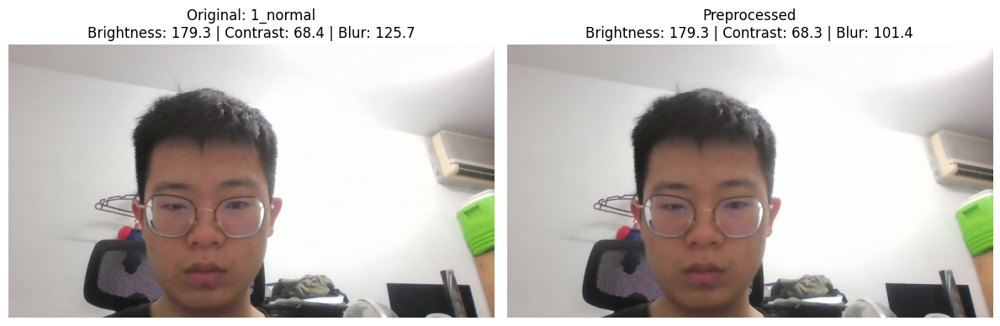


📊 1_normal - Preprocessing Applied:
  - No brightness adjustment needed
  - No contrast adjustment needed
  ✓ Unsharp mask (mild) - blur score was 125.7
  ✓ Bilateral denoise (always applied)
--------------------------------------------------


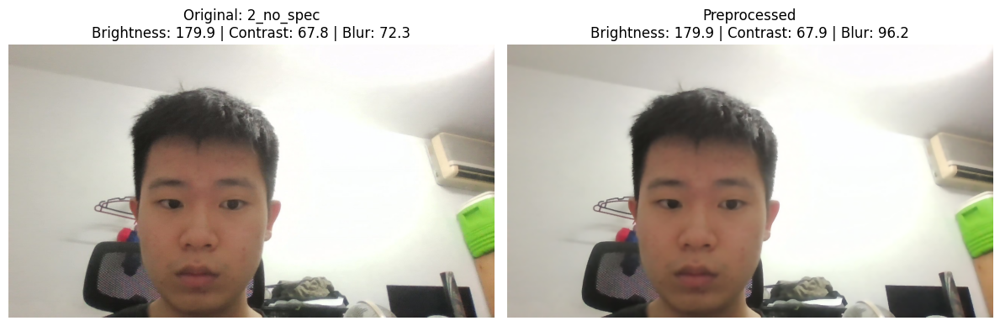


📊 2_no_spec - Preprocessing Applied:
  - No brightness adjustment needed
  - No contrast adjustment needed
  ✓ Unsharp mask (strong) - blur score was 72.3
  ✓ Bilateral denoise (always applied)
--------------------------------------------------

📁 Folder: test_set/ch


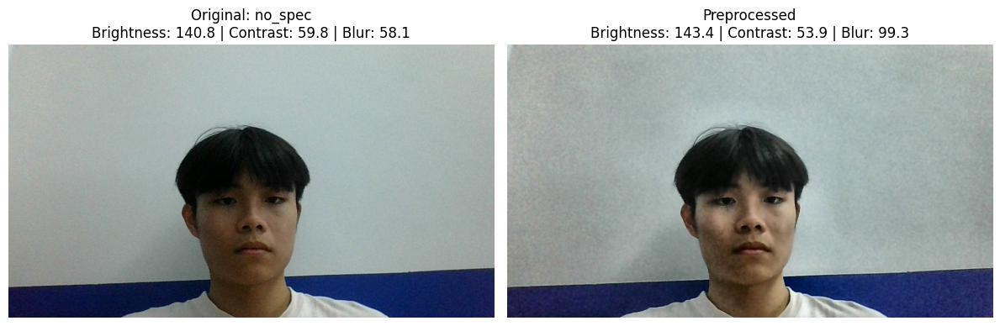


📊 no_spec - Preprocessing Applied:
  - No brightness adjustment needed
  ✓ CLAHE (mild) - contrast was 59.8
  ✓ Unsharp mask (strong) - blur score was 58.1
  ✓ Bilateral denoise (always applied)
--------------------------------------------------


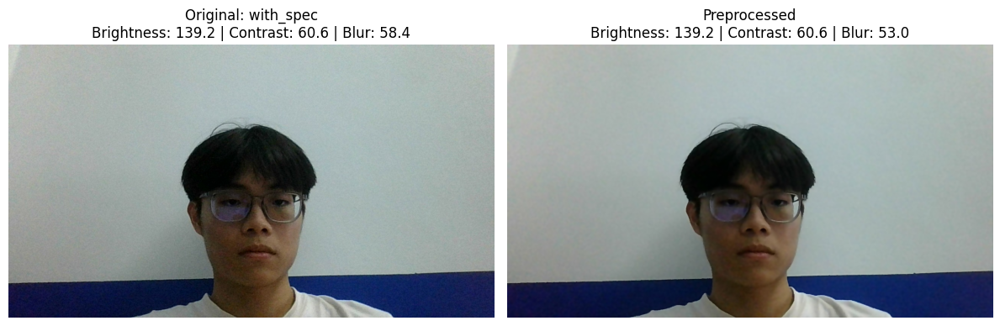


📊 with_spec - Preprocessing Applied:
  - No brightness adjustment needed
  - No contrast adjustment needed
  ✓ Unsharp mask (strong) - blur score was 58.4
  ✓ Bilateral denoise (always applied)
--------------------------------------------------

📁 Folder: test_set/hy


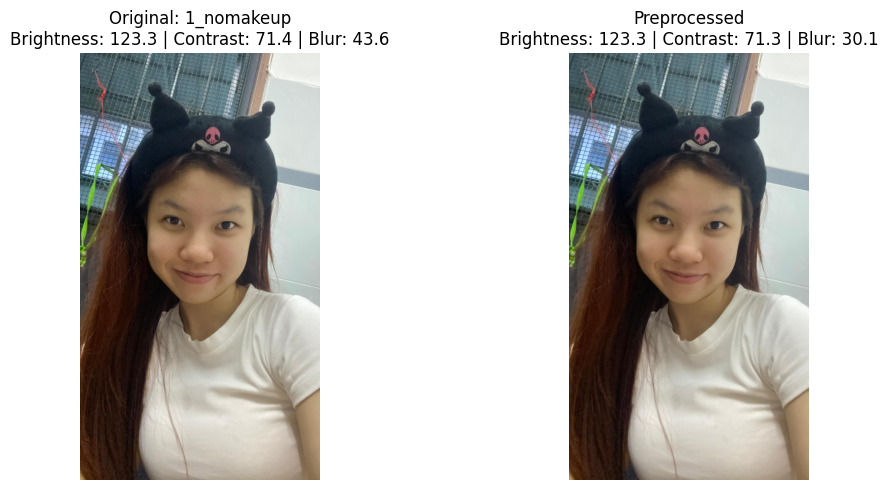


📊 1_nomakeup - Preprocessing Applied:
  - No brightness adjustment needed
  - No contrast adjustment needed
  ✓ Unsharp mask (strong) - blur score was 43.6
  ✓ Bilateral denoise (always applied)
--------------------------------------------------


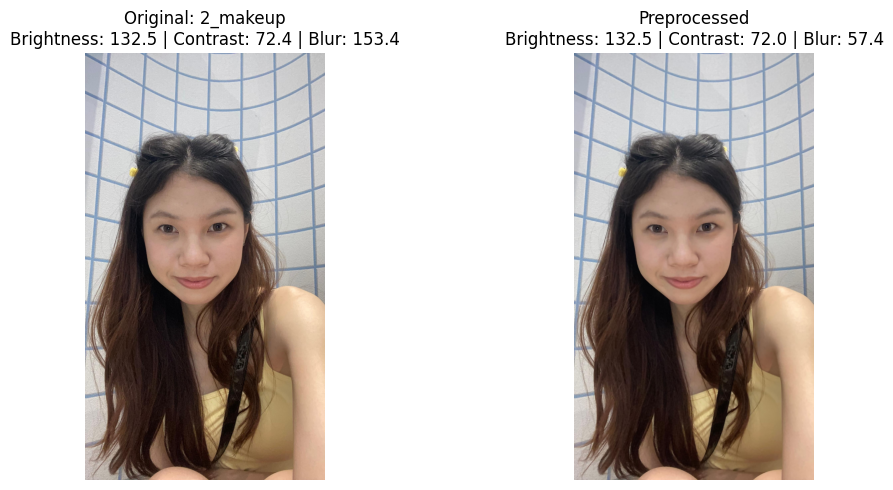


📊 2_makeup - Preprocessing Applied:
  - No brightness adjustment needed
  - No contrast adjustment needed
  ✓ Unsharp mask (mild) - blur score was 153.4
  ✓ Bilateral denoise (always applied)
--------------------------------------------------

📁 Folder: test_set/zq


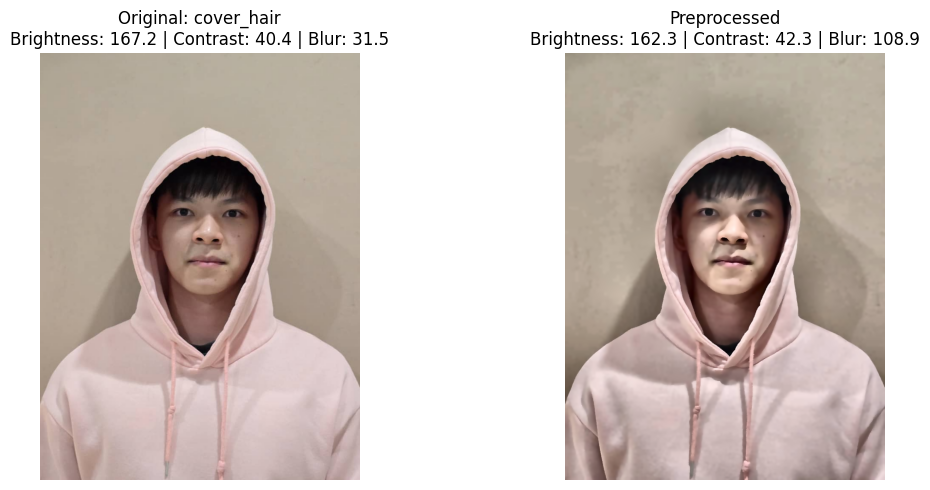


📊 cover_hair - Preprocessing Applied:
  - No brightness adjustment needed
  ✓ CLAHE (mild) - contrast was 40.4
  ✓ Unsharp mask (strong) - blur score was 31.5
  ✓ Bilateral denoise (always applied)
--------------------------------------------------


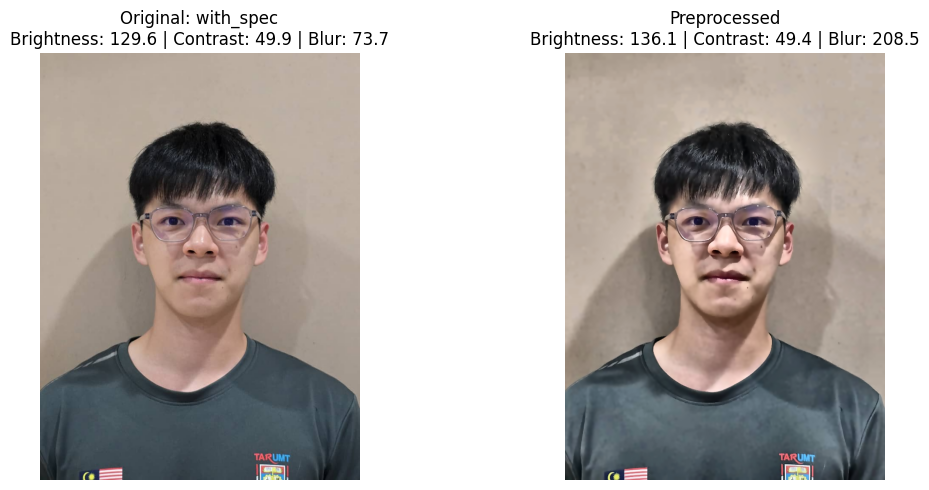


📊 with_spec - Preprocessing Applied:
  - No brightness adjustment needed
  ✓ CLAHE (mild) - contrast was 49.9
  ✓ Unsharp mask (strong) - blur score was 73.7
  ✓ Bilateral denoise (always applied)
--------------------------------------------------


In [60]:
# Cell: Visualize Preprocessing on Test Images

def visualize_preprocessing(test_folder, num_images=5):
    """
    Visualize preprocessing effects on test images
    
    Args:
        test_folder: Path to test images folder
        num_images: Number of images to display
    """
    # Load test images
    test_img_list, img_names = load_img_from_folder(test_folder)
    
    if len(test_img_list) == 0:
        print(f"No images found in {test_folder}")
        return
    
    # Initialize preprocessor
    preprocessor = AdaptivePreprocessor()
    
    # Limit number of images
    num_to_show = min(num_images, len(test_img_list))
    
    for idx in range(num_to_show):
        img = test_img_list[idx]
        img_name = img_names[idx]
        
        # Get image quality metrics
        brightness = preprocessor.estimate_brightness(img)
        contrast = preprocessor.estimate_contrast(img)
        blur_score = preprocessor.estimate_blur(img)
        
        # Apply preprocessing
        processed = preprocessor.process(img)
        
        # Get processed metrics
        brightness_after = preprocessor.estimate_brightness(processed)
        contrast_after = preprocessor.estimate_contrast(processed)
        blur_score_after = preprocessor.estimate_blur(processed)
        
        # Create figure
        fig, axes = plt.subplots(1, 2, figsize=(12, 5))
        
        # Original image
        axes[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
        axes[0].set_title(f"Original: {img_name}\n"
                         f"Brightness: {brightness:.1f} | Contrast: {contrast:.1f} | Blur: {blur_score:.1f}")
        axes[0].axis('off')
        
        # Processed image
        axes[1].imshow(cv.cvtColor(processed, cv.COLOR_BGR2RGB))
        axes[1].set_title(f"Preprocessed\n"
                         f"Brightness: {brightness_after:.1f} | Contrast: {contrast_after:.1f} | Blur: {blur_score_after:.1f}")
        axes[1].axis('off')
        
        plt.tight_layout()
        plt.show()
        
        # Print what was applied
        print(f"\n📊 {img_name} - Preprocessing Applied:")
        if brightness < 80:
            print(f"  ✓ Gamma correction (brighten) - brightness was {brightness:.1f}")
        elif brightness > 180:
            print(f"  ✓ Gamma correction (darken) - brightness was {brightness:.1f}")
        else:
            print(f"  - No brightness adjustment needed")
            
        if contrast < 40:
            print(f"  ✓ CLAHE (strong) - contrast was {contrast:.1f}")
        elif contrast < 60:
            print(f"  ✓ CLAHE (mild) - contrast was {contrast:.1f}")
        else:
            print(f"  - No contrast adjustment needed")
            
        if blur_score < 100:
            print(f"  ✓ Unsharp mask (strong) - blur score was {blur_score:.1f}")
        elif blur_score < 300:
            print(f"  ✓ Unsharp mask (mild) - blur score was {blur_score:.1f}")
        else:
            print(f"  - No sharpening needed")
            
        print(f"  ✓ Bilateral denoise (always applied)")
        print("-" * 50)


# Run visualization on each test folder
print("=" * 60)
print("PREPROCESSING VISUALIZATION")
print("=" * 60)

for folder in ["test_set/fz", "test_set/ch", "test_set/hy", "test_set/zq"]:
    print(f"\n📁 Folder: {folder}")
    print("=" * 60)
    visualize_preprocessing(folder, num_images=3)

SCENARIO-BASED PREPROCESSING VISUALIZATION


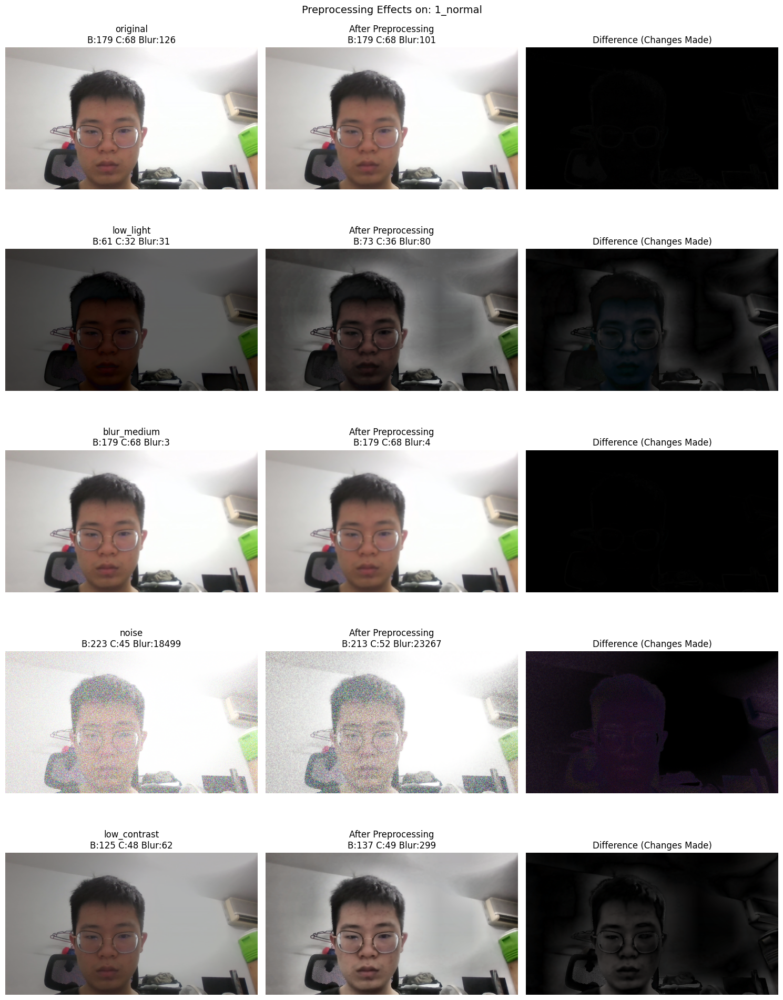

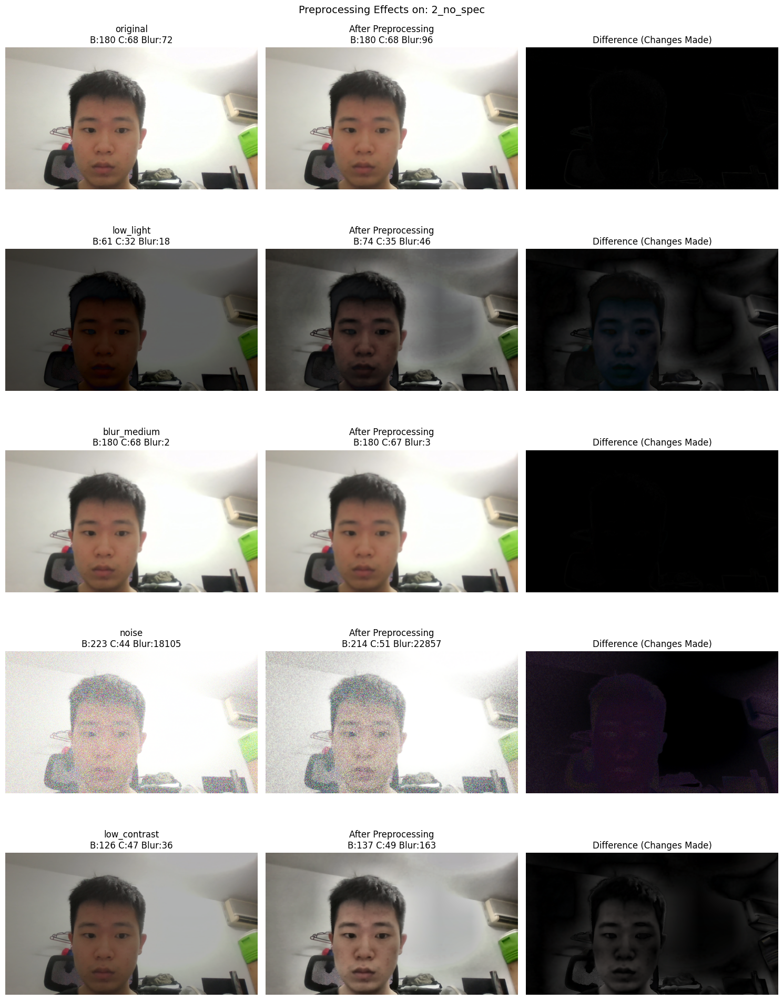

In [61]:
# Cell: Visualize Preprocessing on Augmented Scenarios

def visualize_scenarios_preprocessing(test_folder, num_original=2):
    """
    Visualize preprocessing on augmented scenarios
    """
    test_img_list, img_names = load_img_from_folder(test_folder)
    
    if len(test_img_list) == 0:
        return
    
    preprocessor = AdaptivePreprocessor()
    
    # Process first few images with their scenarios
    for idx in range(min(num_original, len(test_img_list))):
        img = test_img_list[idx]
        img_name = img_names[idx]
        
        # Create scenarios
        scenarios = create_test_scenarios(img)
        
        # Select key scenarios to visualize
        key_scenarios = ['original', 'low_light', 'blur_medium', 'noise', 'low_contrast']
        
        fig, axes = plt.subplots(len(key_scenarios), 3, figsize=(15, 4*len(key_scenarios)))
        
        for row, scenario_name in enumerate(key_scenarios):
            if scenario_name not in scenarios:
                continue
                
            scenario_img = scenarios[scenario_name]
            processed = preprocessor.process(scenario_img)
            
            # Original scenario
            axes[row, 0].imshow(cv.cvtColor(scenario_img, cv.COLOR_BGR2RGB))
            axes[row, 0].set_title(f"{scenario_name}\nB:{preprocessor.estimate_brightness(scenario_img):.0f} "
                                   f"C:{preprocessor.estimate_contrast(scenario_img):.0f} "
                                   f"Blur:{preprocessor.estimate_blur(scenario_img):.0f}")
            axes[row, 0].axis('off')
            
            # Processed
            axes[row, 1].imshow(cv.cvtColor(processed, cv.COLOR_BGR2RGB))
            axes[row, 1].set_title(f"After Preprocessing\nB:{preprocessor.estimate_brightness(processed):.0f} "
                                   f"C:{preprocessor.estimate_contrast(processed):.0f} "
                                   f"Blur:{preprocessor.estimate_blur(processed):.0f}")
            axes[row, 1].axis('off')
            
            # Difference (enhancement visualization)
            diff = cv.absdiff(scenario_img, processed)
            axes[row, 2].imshow(cv.cvtColor(diff, cv.COLOR_BGR2RGB))
            axes[row, 2].set_title("Difference (Changes Made)")
            axes[row, 2].axis('off')
        
        plt.suptitle(f"Preprocessing Effects on: {img_name}", fontsize=14)
        plt.tight_layout()
        plt.show()


# Run on first test folder
print("SCENARIO-BASED PREPROCESSING VISUALIZATION")
visualize_scenarios_preprocessing("test_set/fz", num_original=2)

In [ ]:
import pandas as pd

def comprehensive_comparison(all_results_dict, test_config):
    """
    Compare all models across multiple metrics
    
    Args:
        all_results_dict: Dict of {model_name: (results, summaries)}
        test_config: Test configuration dict
    """
    
    # ============================================
    # 1. OVERALL ACCURACY COMPARISON (Including No Face)
    # ============================================
    print("\n" + "=" * 100)
    print("📊 1. OVERALL ACCURACY COMPARISON (Including No Face Detected)")
    print("=" * 100)
    
    overall_stats = []
    for model_name, (results, summaries) in all_results_dict.items():
        total = len(results)
        correct = sum(1 for r in results if r['correct'])
        no_face = sum(1 for r in results if r['pred_id'] == "No Face")
        not_matched = sum(1 for r in results if r['pred_id'] == "Not Matched")
        wrong = total - correct - no_face - not_matched
        
        acc_incl_noface = correct / total * 100 if total > 0 else 0
        acc_excl_noface = correct / (total - no_face) * 100 if (total - no_face) > 0 else 0
        
        overall_stats.append({
            'Model': model_name,
            'Total': total,
            'Correct': correct,
            'Wrong': wrong,
            'Not Matched': not_matched,
            'No Face': no_face,
            'Acc (incl NoFace)': f"{acc_incl_noface:.2f}%",
            'Acc (excl NoFace)': f"{acc_excl_noface:.2f}%",
            'No Face Rate': f"{no_face/total*100:.2f}%"
        })
    
    df_overall = pd.DataFrame(overall_stats)
    print(df_overall.to_string(index=False))
    
    # ============================================
    # 2. FALSE POSITIVE RATE (FPR) ANALYSIS
    # ============================================
    print("\n" + "=" * 100)
    print("📊 2. FALSE POSITIVE RATE (FPR) ANALYSIS")
    print("=" * 100)
    print("FPR = Wrong Matches / (Total - No Face Detected)")
    print("This measures how often the model incorrectly identifies someone as a different person\n")
    
    fpr_stats = []
    for model_name, (results, summaries) in all_results_dict.items():
        total = len(results)
        no_face = sum(1 for r in results if r['pred_id'] == "No Face")
        wrong = sum(1 for r in results if r['pred_id'] not in ["No Face", "Not Matched", None] and not r['correct'])
        
        detected = total - no_face
        fpr = wrong / detected * 100 if detected > 0 else 0
        
        correct = sum(1 for r in results if r['correct'])
        tpr = correct / detected * 100 if detected > 0 else 0
        
        not_matched = sum(1 for r in results if r['pred_id'] == "Not Matched")
        fnr = not_matched / detected * 100 if detected > 0 else 0
        
        fpr_stats.append({
            'Model': model_name,
            'Detected Faces': detected,
            'True Positives': correct,
            'False Positives': wrong,
            'False Negatives': not_matched,
            'TPR (Recall)': f"{tpr:.2f}%",
            'FPR': f"{fpr:.2f}%",
            'FNR': f"{fnr:.2f}%"
        })
    
    df_fpr = pd.DataFrame(fpr_stats)
    print(df_fpr.to_string(index=False))
    
    # ============================================
    # 3. ACCURACY BY AUGMENTED NOISE TYPE (Excluding Original)
    # ============================================
    print("\n" + "=" * 100)
    print("📊 3. ACCURACY BY AUGMENTED NOISE TYPE (Excluding Original)")
    print("=" * 100)
    
    # Define augmented scenario categories
    augmented_scenarios = {
        'blur_light': 'Blur (Light)',
        'blur_medium': 'Blur (Medium)',
        'blur_heavy': 'Blur (Heavy)',
        'motion_blur': 'Motion Blur',
        'noise': 'Gaussian Noise',
        'low_light': 'Low Light',
        'high_light': 'High Light',
        'low_contrast': 'Low Contrast',
        'high_contrast': 'High Contrast',
        'jpeg_compressed': 'JPEG Compression',
        'rotated_10': 'Rotation (10°)',
        'zoomed': 'Zoomed',
        'cropped_tight': 'Cropped (Tight)',
        'cropped_padded': 'Cropped (Padded)'
    }
    
    # Collect stats for augmented scenarios only
    scenario_comparison = {scenario: {} for scenario in augmented_scenarios.keys()}
    
    model_names = list(all_results_dict.keys())
    
    def extract_scenario(test_name):
        """Extract scenario from test name by matching known scenarios"""
        for scenario_key in augmented_scenarios.keys():
            if test_name.endswith('_' + scenario_key):
                return scenario_key
        if test_name.endswith('_original'):
            return 'original'
        return 'original'
    
    for model_name, (results, _) in all_results_dict.items():
        for r in results:
            scenario = extract_scenario(r['test_name'])
            
            # Skip original images
            if scenario == 'original' or scenario not in augmented_scenarios:
                continue
            
            if model_name not in scenario_comparison[scenario]:
                scenario_comparison[scenario][model_name] = {'total': 0, 'correct': 0, 'no_face': 0}
            
            scenario_comparison[scenario][model_name]['total'] += 1
            if r['correct']:
                scenario_comparison[scenario][model_name]['correct'] += 1
            if r['pred_id'] == 'No Face':
                scenario_comparison[scenario][model_name]['no_face'] += 1
    
    # Build comparison table
    scenario_rows = []
    
    for scenario_key, scenario_label in augmented_scenarios.items():
        # Check if any model has data for this scenario
        has_data = any(model in scenario_comparison[scenario_key] and 
                      scenario_comparison[scenario_key][model]['total'] > 0 
                      for model in model_names)
        
        if not has_data:
            continue
            
        row = {'Noise Type': scenario_label}
        for model in model_names:
            if model in scenario_comparison[scenario_key]:
                data = scenario_comparison[scenario_key][model]
                if data['total'] > 0:
                    acc = data['correct'] / data['total'] * 100
                    no_face_rate = data['no_face'] / data['total'] * 100
                    row[f'{model[:12]} Acc'] = f"{acc:.1f}%"
                    row[f'{model[:12]} NoFace'] = f"{no_face_rate:.1f}%"
                else:
                    row[f'{model[:12]} Acc'] = "N/A"
                    row[f'{model[:12]} NoFace'] = "N/A"
            else:
                row[f'{model[:12]} Acc'] = "N/A"
                row[f'{model[:12]} NoFace'] = "N/A"
        scenario_rows.append(row)
    
    df_scenario = pd.DataFrame(scenario_rows)
    print(df_scenario.to_string(index=False))
    
    # ============================================
    # 4. ACCURACY BY FOLDER/SUBJECT
    # ============================================
    print("\n" + "=" * 100)
    print("📊 4. ACCURACY BY FOLDER/SUBJECT")
    print("=" * 100)
    
    folder_comparison = {}
    
    for model_name, (results, summaries) in all_results_dict.items():
        for summary in summaries:
            folder = summary['folder'].split('/')[-1]
            if folder not in folder_comparison:
                folder_comparison[folder] = {}
            
            folder_comparison[folder][model_name] = {
                'correct': summary['correct'],
                'total': summary['total'],
                'no_face': summary['no_face'],
                'accuracy': summary['accuracy']
            }
    
    print(f"\n{'Folder':<12}", end="")
    for model in model_names:
        print(f" | {model[:12]:^12} Acc | NoFace", end="")
    print()
    print("-" * (12 + len(model_names) * 28))
    
    for folder in sorted(folder_comparison.keys()):
        print(f"{folder:<12}", end="")
        for model in model_names:
            if model in folder_comparison[folder]:
                data = folder_comparison[folder][model]
                print(f" | {data['accuracy']:>10.1f}% | {data['no_face']:>5}", end="")
            else:
                print(f" | {'N/A':>10} | {'N/A':>5}", end="")
        print()
    
    # ============================================
    # 5. SCENARIO ACCURACY MATRIX (for heatmap)
    # ============================================
    print("\n" + "=" * 100)
    print("📊 5. SCENARIO ACCURACY MATRIX (Augmented Only)")
    print("=" * 100)
    
    scenario_matrix = []
    for scenario_key, scenario_label in augmented_scenarios.items():
        has_data = any(model in scenario_comparison[scenario_key] and 
                      scenario_comparison[scenario_key][model]['total'] > 0 
                      for model in model_names)
        if not has_data:
            continue
        row = [scenario_label]
        for model in model_names:
            if model in scenario_comparison[scenario_key]:
                data = scenario_comparison[scenario_key][model]
                acc = data['correct'] / data['total'] * 100 if data['total'] > 0 else 0
                row.append(round(acc, 1))
            else:
                row.append(0)
        scenario_matrix.append(row)
    
    df_matrix = pd.DataFrame(scenario_matrix, columns=['Noise Type'] + model_names)
    print(df_matrix.to_string(index=False))
    
    return df_overall, df_fpr, df_scenario, df_matrix

In [65]:

all_results_dict = {
    'HOG+Dlib': (hog_results, hog_summaries),
    'DeepFace': (deepface_results, deepface_summaries),
    'MTCNN+FaceNet': (mtcnn_results, mtcnn_summaries),
    'InsightFace': (insightface_results, insightface_summaries)
}

df_overall, df_fpr, df_scenario, df_matrix = comprehensive_comparison(all_results_dict, test_config)


📊 1. OVERALL ACCURACY COMPARISON (Including No Face Detected)
        Model  Total  Correct  Wrong  Not Matched  No Face Acc (incl NoFace) Acc (excl NoFace) No Face Rate
     HOG+Dlib    120      106      4            0       10            88.33%            96.36%        8.33%
     DeepFace    120       82     17            0       21            68.33%            82.83%       17.50%
MTCNN+FaceNet    120       93     17            6        4            77.50%            80.17%        3.33%
  InsightFace    120       95      0            4       21            79.17%            95.96%       17.50%

📊 2. FALSE POSITIVE RATE (FPR) ANALYSIS
FPR = Wrong Matches / (Total - No Face Detected)
This measures how often the model incorrectly identifies someone as a different person

        Model  Detected Faces  True Positives  False Positives  False Negatives TPR (Recall)    FPR   FNR
     HOG+Dlib             110             106                4                0       96.36%  3.64% 0.00%
     De

In [66]:
# Cell: Visual Charts for Sections 1, 2, and 5

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

def plot_section_charts(all_results_dict):
    """Create visual charts for sections 1, 2, and 5"""
    
    model_names = list(all_results_dict.keys())
    
    # ============================================
    # CHART 1: OVERALL ACCURACY COMPARISON
    # ============================================
    print("=" * 60)
    print("📊 CHART 1: OVERALL ACCURACY COMPARISON")
    print("=" * 60)
    
    acc_incl = []
    acc_excl = []
    no_face_rates = []
    
    for model_name, (results, _) in all_results_dict.items():
        total = len(results)
        correct = sum(1 for r in results if r['correct'])
        no_face = sum(1 for r in results if r['pred_id'] == "No Face")
        
        acc_incl.append(correct / total * 100 if total > 0 else 0)
        acc_excl.append(correct / (total - no_face) * 100 if (total - no_face) > 0 else 0)
        no_face_rates.append(no_face / total * 100)
    
    fig, ax = plt.subplots(figsize=(12, 6))
    x = np.arange(len(model_names))
    width = 0.35
    
    bars1 = ax.bar(x - width/2, acc_incl, width, label='Accuracy (incl. No Face)', color='#3498db')
    bars2 = ax.bar(x + width/2, acc_excl, width, label='Accuracy (excl. No Face)', color='#2ecc71')
    
    ax.set_xlabel('Model', fontsize=12)
    ax.set_ylabel('Accuracy (%)', fontsize=12)
    ax.set_title('1. Overall Accuracy Comparison', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, fontsize=11)
    ax.legend(fontsize=10)
    ax.set_ylim(0, 110)
    ax.grid(axis='y', alpha=0.3)
    
    # Add value labels
    for bar in bars1:
        height = bar.get_height()
        ax.annotate(f'{height:.1f}%', xy=(bar.get_x() + bar.get_width()/2, height),
                    ha='center', va='bottom', fontsize=10, fontweight='bold')
    for bar in bars2:
        height = bar.get_height()
        ax.annotate(f'{height:.1f}%', xy=(bar.get_x() + bar.get_width()/2, height),
                    ha='center', va='bottom', fontsize=10, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    # ============================================
    # CHART 2: FALSE POSITIVE RATE (FPR) ANALYSIS
    # ============================================
    print("\n" + "=" * 60)
    print("📊 CHART 2: FALSE POSITIVE RATE (FPR) ANALYSIS")
    print("=" * 60)
    
    tpr_rates = []
    fpr_rates = []
    fnr_rates = []
    
    for model_name, (results, _) in all_results_dict.items():
        total = len(results)
        no_face = sum(1 for r in results if r['pred_id'] == "No Face")
        correct = sum(1 for r in results if r['correct'])
        wrong = sum(1 for r in results if r['pred_id'] not in ["No Face", "Not Matched", None] and not r['correct'])
        not_matched = sum(1 for r in results if r['pred_id'] == "Not Matched")
        
        detected = total - no_face
        tpr_rates.append(correct / detected * 100 if detected > 0 else 0)
        fpr_rates.append(wrong / detected * 100 if detected > 0 else 0)
        fnr_rates.append(not_matched / detected * 100 if detected > 0 else 0)
    
    fig, ax = plt.subplots(figsize=(12, 6))
    x = np.arange(len(model_names))
    width = 0.25
    
    bars1 = ax.bar(x - width, tpr_rates, width, label='TPR (Recall) ↑', color='#2ecc71')
    bars2 = ax.bar(x, fpr_rates, width, label='FPR ↓', color='#e74c3c')
    bars3 = ax.bar(x + width, fnr_rates, width, label='FNR ↓', color='#f39c12')
    
    ax.set_xlabel('Model', fontsize=12)
    ax.set_ylabel('Rate (%)', fontsize=12)
    ax.set_title('2. False Positive Rate (FPR) Analysis\n(↑ = Higher is Better, ↓ = Lower is Better)', fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(model_names, fontsize=11)
    ax.legend(fontsize=10)
    ax.set_ylim(0, 110)
    ax.grid(axis='y', alpha=0.3)
    
    # Add value labels
    for bars in [bars1, bars2, bars3]:
        for bar in bars:
            height = bar.get_height()
            if height > 0:
                ax.annotate(f'{height:.1f}%', xy=(bar.get_x() + bar.get_width()/2, height),
                            ha='center', va='bottom', fontsize=9, fontweight='bold')
    
    plt.tight_layout()
    plt.show()
    
    # ============================================
    # CHART 5: SCENARIO ACCURACY HEATMAP
    # ============================================
    print("\n" + "=" * 60)
    print("📊 CHART 5: SCENARIO ACCURACY HEATMAP (Augmented Only)")
    print("=" * 60)
    
    # Define augmented scenarios
    augmented_scenarios = {
        'blur_light': 'Blur (Light)',
        'blur_medium': 'Blur (Medium)',
        'blur_heavy': 'Blur (Heavy)',
        'motion_blur': 'Motion Blur',
        'noise': 'Gaussian Noise',
        'low_light': 'Low Light',
        'high_light': 'High Light',
        'low_contrast': 'Low Contrast',
        'high_contrast': 'High Contrast',
        'jpeg_compressed': 'JPEG Compression',
        'rotated_10': 'Rotation (10°)',
        'zoomed': 'Zoomed',
        'cropped_tight': 'Cropped (Tight)',
        'cropped_padded': 'Cropped (Padded)'
    }
    
    # Collect stats
    scenario_comparison = {scenario: {} for scenario in augmented_scenarios.keys()}
    
    def extract_scenario(test_name):
        for scenario_key in augmented_scenarios.keys():
            if test_name.endswith('_' + scenario_key):
                return scenario_key
        return 'original'
    
    for model_name, (results, _) in all_results_dict.items():
        for r in results:
            scenario = extract_scenario(r['test_name'])
            if scenario == 'original' or scenario not in augmented_scenarios:
                continue
            
            if model_name not in scenario_comparison[scenario]:
                scenario_comparison[scenario][model_name] = {'total': 0, 'correct': 0}
            
            scenario_comparison[scenario][model_name]['total'] += 1
            if r['correct']:
                scenario_comparison[scenario][model_name]['correct'] += 1
    
    # Build matrix for heatmap
    scenario_labels = []
    matrix_data = []
    
    for scenario_key, scenario_label in augmented_scenarios.items():
        has_data = any(model in scenario_comparison[scenario_key] and 
                      scenario_comparison[scenario_key][model]['total'] > 0 
                      for model in model_names)
        if not has_data:
            continue
        
        scenario_labels.append(scenario_label)
        row = []
        for model in model_names:
            if model in scenario_comparison[scenario_key]:
                data = scenario_comparison[scenario_key][model]
                acc = data['correct'] / data['total'] * 100 if data['total'] > 0 else 0
                row.append(round(acc, 1))
            else:
                row.append(0)
        matrix_data.append(row)
    
    # Create heatmap
    fig, ax = plt.subplots(figsize=(12, 10))
    
    matrix_array = np.array(matrix_data)
    
    im = ax.imshow(matrix_array, cmap='RdYlGn', aspect='auto', vmin=0, vmax=100)
    
    # Set ticks
    ax.set_xticks(np.arange(len(model_names)))
    ax.set_yticks(np.arange(len(scenario_labels)))
    ax.set_xticklabels(model_names, fontsize=11)
    ax.set_yticklabels(scenario_labels, fontsize=10)
    
    # Rotate x labels
    plt.setp(ax.get_xticklabels(), rotation=15, ha='right')
    
    # Add colorbar
    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel('Accuracy (%)', rotation=-90, va='bottom', fontsize=11)
    
    # Add text annotations
    for i in range(len(scenario_labels)):
        for j in range(len(model_names)):
            value = matrix_array[i, j]
            text_color = 'white' if value < 50 else 'black'
            ax.text(j, i, f'{value:.0f}%', ha='center', va='center', 
                   color=text_color, fontsize=9, fontweight='bold')
    
    ax.set_title('5. Scenario Accuracy Matrix (Augmented Only)\nGreen = High Accuracy, Red = Low Accuracy', 
                 fontsize=14, fontweight='bold')
    ax.set_xlabel('Model', fontsize=12)
    ax.set_ylabel('Noise Type', fontsize=12)
    
    plt.tight_layout()
    plt.show()
    
    return


📊 CHART 1: OVERALL ACCURACY COMPARISON


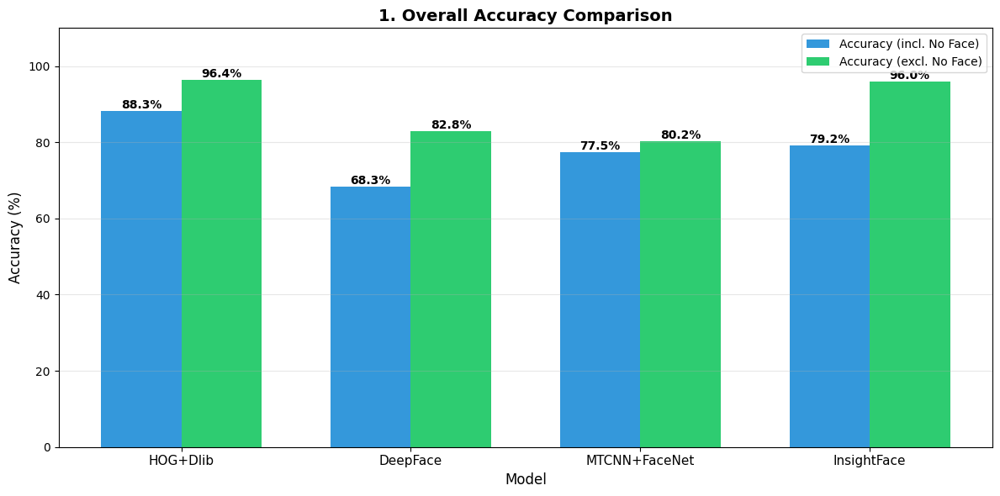


📊 CHART 2: FALSE POSITIVE RATE (FPR) ANALYSIS


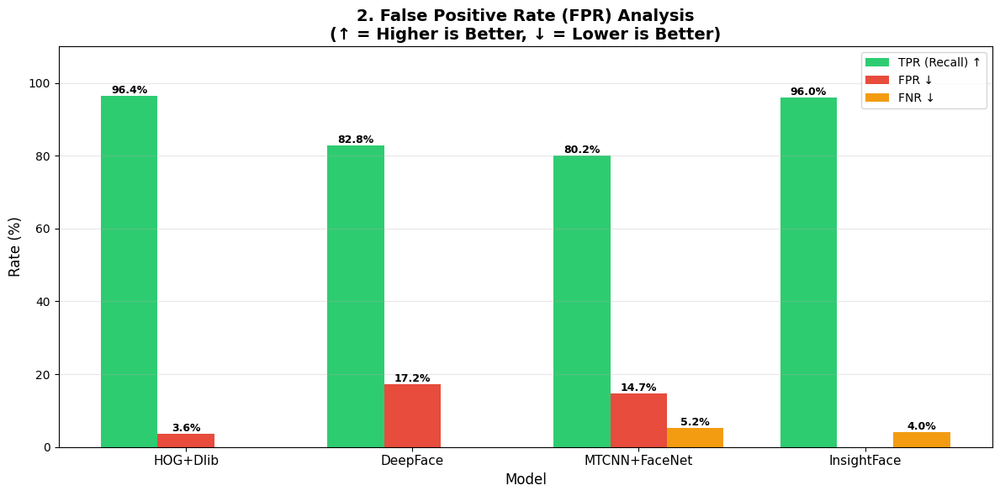


📊 CHART 5: SCENARIO ACCURACY HEATMAP (Augmented Only)


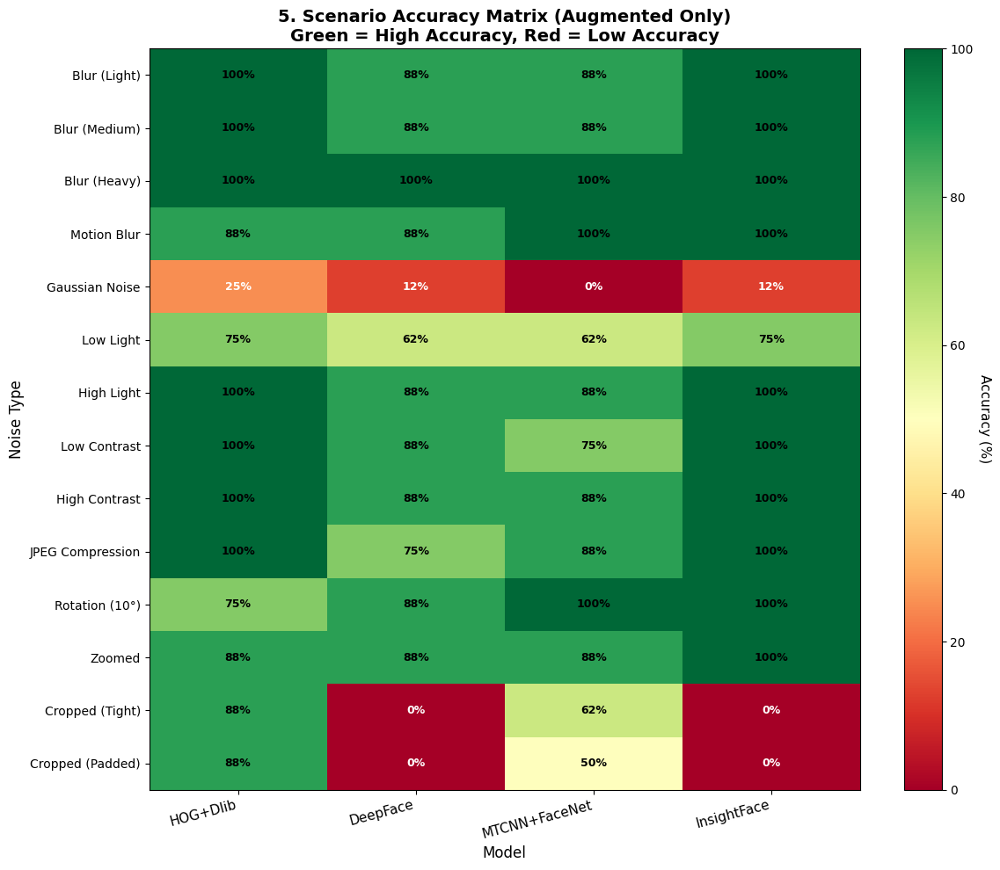

In [67]:


# Run the charts
plot_section_charts(all_results_dict)